In [1]:
import numpy as np
import pandas as pd
import os
import warnings
import ggseg_python
import re
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#import neuroHarmonize
from neuroHarmonize import harmonizationLearn, harmonizationApply, loadHarmonizationModel, saveHarmonizationModel

import seaborn as sns
from functools import reduce
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import KFold, StratifiedKFold

from keras import layers
from keras.layers import Input, Lambda,Reshape, LeakyReLU, ReLU, Dense, Dropout, BatchNormalization, Activation, Flatten,concatenate, Conv2D,Conv2DTranspose, MaxPooling2D,MaxPooling3D,Bidirectional, ConvLSTM2D, GRU, UpSampling2D
from keras.models import Model, Sequential, load_model, save_model
from keras.optimizers import Adam, rmsprop
from keras.utils import to_categorical
from keras.layers.merge import concatenate as concat
from keras.losses import mse, binary_crossentropy
from keras import backend as K
from sklearn.utils import class_weight

import scipy
import statsmodels
from statsmodels.stats.multitest import fdrcorrection
from statsmodels.stats.multitest import fdrcorrection_twostage


%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


Using TensorFlow backend.


# ADNI and KARI --> MRI volumes

### ANOVA p-values between MRI volumes of ADNI and KARI

In [2]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


#######################################################
##---------------- ADNI -----------------------------
#######################################################

# 'UCSFFSL51Y1_08_01_16.csv' -- Longitudinal Freesurfer 5.1 (ADNI 2/GO 3T 2010-2016)
# 'UCSFFSX51FINAL_11_08_19.csv' -- Cross-sectional Freesurfer 5.1 (ADNI 2/GO 3T 2010-2016)
# 'UCSFFSL_02_01_16.csv' -- Longitudinal Freesurfer 4.4 (ADNI 1 maybe?)
# 'UCSFFSX_11_02_15' -- Cross-sectional Freesurfer 4.3 (ADNI 1 maybe)
# 'UCSFFSX6_03_02_21.csv' -- Cross-sectional Freesurfer 6 (ADNI 3 3T)

tadpole_challenge_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/tadpole_challenge'
roi_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/MR_Image_Analysis'
pet_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/PET_Image_Analysis'

all_atn_adni = merge_atn_dates_adni(roi_path, pet_path, missing = True)

adnimerge_cols = ['RID', 'EXAMDATE', 'DX_bl', 'AGE', 'PTGENDER', 'ICV_bl']
adnimerge = pd.read_csv(os.path.join(tadpole_challenge_path, 'ADNIMERGE.csv'), low_memory = False)[adnimerge_cols].rename(columns = {'ICV_bl':'Intracranial_vol'})
  
#adnimerge_bl = get_demo_adni(tadpole_challenge_path)
#temp_adni = get_roi_adni(roi_path, adnimerge_bl)

ucsf_data = pd.read_csv(os.path.join(roi_path, 'UCSFFSX6_03_02_21.csv'))

ADNI_MRI_vol, cortical_cols_MRI, subcortical_cols_MRI = get_adni_mri_vol(adnimerge, ucsf_data, all_atn_adni)
ADNI_MRI_vol = ADNI_MRI_vol.drop_duplicates().reset_index(drop = True)

cdr = pd.read_csv('/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/CDR.csv')
ADNI_MRI = add_cdr_mri_adni(cdr, ADNI_MRI_vol)
ADNI_MRI = ADNI_MRI.rename(columns = {'EXAMDATE':'MR_Date'}).dropna(subset = ['Intracranial_vol'])

ADNI_MRI['AGE'] = ADNI_MRI['AGE'].fillna(ADNI_MRI['AGE'].mean())
ADNI_MRI['CDGLOBAL'] = ADNI_MRI['CDGLOBAL'].fillna(ADNI_MRI['CDGLOBAL'].mode()[0])
ADNI_MRI['PTGENDER'] = ADNI_MRI['PTGENDER'].fillna(ADNI_MRI['PTGENDER'].mode()[0])

print('CDR distribution for ADNI MRI vol = \n{}'.format(ADNI_MRI['CDGLOBAL'].value_counts()))
print('Number of patients having ADNI MRI vol = {}'.format(ADNI_MRI.RID.nunique()))


#######################################################
##---------------- KARI -----------------------------
#######################################################


adni_kari_MRI_cort_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/ADNI_KARI_MRI_cort_dict.csv'))
adni_kari_MRI_subcort_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/ADNI_KARI_MRI_subcort_dict.csv'))

kari_imaging_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/imaging'

mri = pd.read_excel(os.path.join(kari_imaging_path, 'mri_t3.xlsx'))

all_atn_kari= merge_atn_dates_kari(mri, adni_kari_MRI_cort_dict, adni_kari_MRI_subcort_dict, kari_imaging_path, missing = True)

kari_demo = pd.read_excel('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/clinical_core/mod_demographics.xlsx')[['ID', 'sex', 'BIRTH']]

kari_demo = kari_demo.loc[kari_demo.ID.isin(all_atn_kari.ID.unique())].reset_index(drop = True)

#----------------------------------------------


KARI_MRI_vol = get_kari_mri_vol(mri, all_atn_kari, adni_kari_MRI_cort_dict, adni_kari_MRI_subcort_dict, cortical_cols_MRI, subcortical_cols_MRI)
                 
demo_kari_temp = kari_demo.merge(KARI_MRI_vol, on = 'ID', how = 'right')
demo_kari_temp['Age'] = (abs(pd.to_datetime(demo_kari_temp['MR_Date']) - pd.to_datetime(demo_kari_temp['BIRTH'])).dt.days)/365

cdr = pd.read_excel(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/clinical_core/mod_b4_cdr.xlsx'))[['ID', 'TESTDATE', 'cdr']]
KARI_MRI = add_cdr_mri_kari(cdr, KARI_MRI_vol)

demo_kari_temp = kari_demo.merge(KARI_MRI_vol, on = 'ID', how = 'right')
demo_kari_temp['Age'] = (abs(pd.to_datetime(demo_kari_temp['MR_Date']) - pd.to_datetime(demo_kari_temp['BIRTH'])).dt.days)/365
demo_kari_temp = demo_kari_temp.drop(columns = 'BIRTH').rename(columns = {'TESTDATE':'CDR_Date'})

cdr = pd.read_excel(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/clinical_core/mod_b4_cdr.xlsx'))[['ID', 'TESTDATE', 'cdr']]
KARI_MRI = add_cdr_mri_kari(cdr, demo_kari_temp).rename(columns = {'TESTDATE':'CDR_Date'})
KARI_MRI['cdr'] = KARI_MRI['cdr'].fillna(KARI_MRI['cdr'].mode()[0])

print('CDR distribution for KARI MRI vol = \n{}'.format(KARI_MRI['cdr'].value_counts()))
print('Number of patients having KARI MRI vol = {}'.format(KARI_MRI.ID.nunique()))

#######################################################
##---------------- P-value maps between ADNI and KARI ---
#######################################################

#plot_p_maps_MRI(ADNI_MRI, KARI_MRI, cortical_cols_MRI, subcortical_cols_MRI)


##------------ Combine both dataframes -----------------
mri_vol_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI

ADNI_MRI_final= ADNI_MRI.rename(columns = {'RID':'ID', 'AGE':'Age', 'PTGENDER':'Sex', 'CDGLOBAL':'cdr'}).drop(columns = ['DX_bl', 'Intracranial_vol']).reindex(columns=mri_vol_cols)
KARI_MRI_final = KARI_MRI.rename(columns = {'sex':'Sex'}).reindex(columns=mri_vol_cols)
ADNI_MRI_final['dataset'] = 'ADNI'
KARI_MRI_final['dataset'] = 'KARI'

MRI_both = pd.concat([ADNI_MRI_final, KARI_MRI_final])

MRI_both = MRI_both.rename(columns={c: c+'_Nvol' for c in MRI_both.columns if c not in ['ID', 'Age', 'Sex', 'MR_Date', 'CDR_Date', 'cdr', 'dataset']})




Number of vol cortical columns selected from ADNI T1 MRI = 66
Number of vol subcortical columns selected from ADNI T1 MRI= 24

CDR distribution for ADNI MRI vol = 
0.0    464
0.5    282
1.0     51
2.0      7
3.0      2
Name: CDGLOBAL, dtype: int64
Number of patients having ADNI MRI vol = 806
Number of vol cortical columns selected from KARI T1 MRI = 66
Number of vol subcortical columns selected from KARI T1 MRI= 24

CDR distribution for KARI MRI vol = 
0.0    949
0.5    233
1.0     86
2.0      2
Name: cdr, dtype: int64
Number of patients having KARI MRI vol = 1270


# ADNI and KARI Amyloid SUVR

### ANOVA p-values between Amyloid SUVR of ADNI and KARI

In [3]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


#######################################################
##---------------- ADNI -----------------------------
#######################################################

pet_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/PET_Image_Analysis'
adni_amyloid = pd.read_csv(os.path.join(pet_path, 'UCBERKELEYAV45_04_26_22.csv'))

ADNI_amyloid_suvr, cortical_cols_adni_amyloid, subcortical_cols_adni_amyloid = get_adni_amyloid_SUVR(adni_amyloid)

ADNI_amyloid_suvr = pd.merge(ADNI_amyloid_suvr, all_atn_adni[['RID', 'amyloid_date', 'amyloid_present']], left_on = ['RID', 'EXAMDATE'], right_on = ['RID', 'amyloid_date'], how = 'right').drop(columns = 'EXAMDATE').reset_index(drop = True)

cols_add = ['RID', 'MR_Date', 'DX_bl', 'AGE', 'PTGENDER', 'CDR_Date', 'CDGLOBAL']
ADNI_amyloid = pd.merge(ADNI_amyloid_suvr, ADNI_MRI[cols_add], on = 'RID', how = 'inner')
ADNI_amyloid['amyloid_present'] = 'yes'
ADNI_amyloid.loc[(pd.isnull(ADNI_amyloid['amyloid_date']) == True), 'amyloid_present'] = 'no'

print('CDR distribution for ADNI amyloid SUVR = \n{}'.format(ADNI_amyloid['CDGLOBAL'].value_counts()))
print('Number of patients having ADNI MRI vol = {}'.format(ADNI_MRI.RID.nunique()))
print('Number of patients having MRI vol and Amyloid SUVR = {}'.format(len(ADNI_amyloid.loc[ADNI_amyloid['amyloid_present'] == 'yes'])))

ADNI_amyloid = ADNI_amyloid.rename(columns = {'Left-Thalamus-Proper':'Left-Thalamus', 'Right-Thalamus-Proper':'Right-Thalamus', 'Left-Ventraldc':'Left-VentralDC', 'Right-Ventraldc':'Right-VentralDC', 'Brainstem':'Brain-Stem'})


#######################################################
##---------------- KARI -----------------------------
#######################################################

adni_kari_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/adni_kari_ROI_names_dict.csv'))
adni_kari_subcortical_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/adni_kari_subcortical_SUVR_dict.csv'))

kari_imaging_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/imaging'

av45 = pd.read_excel(os.path.join(kari_imaging_path, 'av45.xlsx'))
av45 = av45.sort_values(by = ['ID', 'PET_Date'])#.drop_duplicates(subset = 'ID', keep = 'first').reset_index(drop = True)

av45_kari, cortical_cols_kari_amyloid, subcortical_cols_kari_amyloid = kari_brain_amyloid_SUVR(av45, adni_kari_dict, adni_kari_subcortical_dict)

# kari_amyloid_suvr = pd.merge(av45_kari, all_atn_kari[['ID', 'amyloid_date']], left_on = ['ID', 'PET_Date'], right_on = ['ID', 'amyloid_date'], how = 'left')#.dropna(subset = ['amyloid_date']).drop(columns = 'PET_Date').reset_index(drop = True)

KARI_amyloid_suvr = pd.merge(av45_kari, all_atn_kari[['ID', 'amyloid_date', 'amyloid_present']], left_on = ['ID', 'PET_Date'], right_on = ['ID', 'amyloid_date'], how = 'right').drop(columns = 'PET_Date').reset_index(drop = True)

cols_add = ['ID', 'MR_Date', 'sex', 'Age', 'CDR_Date', 'cdr']
KARI_amyloid = pd.merge(KARI_amyloid_suvr, KARI_MRI[cols_add], on = 'ID', how = 'inner')
# KARI_amyloid['amyloid_present'] = 'yes'
# KARI_amyloid.loc[(pd.isnull(KARI_amyloid['amyloid_date']) == True), 'amyloid_present'] = 'no'
KARI_amyloid.loc[(pd.isnull(KARI_amyloid['Brain-Stem']) == True), 'amyloid_present'] = 'no'

print('Number of vol cortical columns selected from KARI Amyloid = {}'.format(len(cortical_cols_kari_amyloid)))
print('Number of vol subcortical columns selected from KARI Amyloid = {}\n'.format(len(subcortical_cols_kari_amyloid)))

print('CDR distribution for KARI amyloid SUVR = \n{}'.format(KARI_amyloid['cdr'].value_counts()))
print('Number of patients having KARI MRI vol = {}'.format(KARI_MRI.ID.nunique()))
print('Number of patients having MRI vol and Amyloid SUVR = {}'.format(len(KARI_amyloid.loc[KARI_amyloid['amyloid_present'] == 'yes'])))

# for col in cortical_cols_kari_amyloid, subcortical_cols_kari_amyloid:
#     KARI_amyloid[col] = KARI_amyloid[col].fillna(KARI_amyloid[col].mean())

#######################################################
##---------------- P-value maps between ADNI and KARI ---
#######################################################

#plot_p_maps_amyloid(ADNI_amyloid, KARI_amyloid, cortical_cols_MRI, subcortical_cols_MRI)


##------------ Combine both dataframes -----------------
amyloid_SUVR_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'amyloid_present', 'amyloid_date',  'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI

ADNI_amyloid_final= ADNI_amyloid.rename(columns = {'RID':'ID', 'AGE':'Age', 'PTGENDER':'Sex', 'CDGLOBAL':'cdr'}).drop(columns = ['DX_bl']).reindex(columns=amyloid_SUVR_cols)
KARI_amyloid_final = KARI_amyloid.rename(columns = {'sex':'Sex'}).reindex(columns=amyloid_SUVR_cols)
ADNI_amyloid_final['dataset'] = 'ADNI'
KARI_amyloid_final['dataset'] = 'KARI'

amyloid_both = pd.concat([ADNI_amyloid_final, KARI_amyloid_final])

amyloid_both = amyloid_both.rename(columns={c: c+'_Asuvr' for c in amyloid_both.columns if c not in ['ID', 'Age', 'Sex', 'MR_Date', 'amyloid_present', 'amyloid_date',  'CDR_Date', 'cdr', 'dataset']})




Number of SUVR cortical columns selected from ADNI av45 = 66
Number of SUVR subcortical columns selected from ADNI av45= 24

CDR distribution for ADNI amyloid SUVR = 
0.0    464
0.5    282
1.0     51
2.0      7
3.0      2
Name: CDGLOBAL, dtype: int64
Number of patients having ADNI MRI vol = 806
Number of patients having MRI vol and Amyloid SUVR = 504
Number of vol cortical columns selected from KARI Amyloid = 66
Number of vol subcortical columns selected from KARI Amyloid = 24

CDR distribution for KARI amyloid SUVR = 
0.0    949
0.5    233
1.0     86
2.0      2
Name: cdr, dtype: int64
Number of patients having KARI MRI vol = 1270
Number of patients having MRI vol and Amyloid SUVR = 536


# ADNI and KARI Tau SUVR

### ANOVA p-values between Tau SUVR of ADNI and KARI

In [4]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


#######################################################
##---------------- ADNI -----------------------------
#######################################################

pet_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/PET_Image_Analysis'
temp_tau = pd.read_csv(os.path.join(pet_path, 'UCBERKELEYAV1451_04_26_22.csv')).sort_values(by = ['RID', 'EXAMDATE']).reset_index(drop = True)

ADNI_tau_suvr, cortical_cols_tau, subcortical_cols_tau = get_adni_tau_SUVR(temp_tau)

ADNI_tau_suvr = ADNI_tau_suvr.rename(columns = {'Left-Thalamus-Proper':'Left-Thalamus', 'Right-Thalamus-Proper':'Right-Thalamus', 'Left-Ventraldc':'Left-VentralDC', 'Right-Ventraldc':'Right-VentralDC', 'Brainstem':'Brain-Stem'})

ADNI_tau_suvr = pd.merge(ADNI_tau_suvr, all_atn_adni[['RID', 'tau_date', 'tau_present']], left_on = ['RID', 'EXAMDATE'], right_on = ['RID', 'tau_date'], how = 'right').drop(columns = 'EXAMDATE').reset_index(drop = True)

cols_add = ['RID', 'MR_Date', 'DX_bl', 'AGE', 'PTGENDER', 'CDR_Date', 'CDGLOBAL']
ADNI_tau = pd.merge(ADNI_tau_suvr, ADNI_MRI[cols_add], on = 'RID', how = 'inner')
ADNI_tau['tau_present'] = 'yes'
ADNI_tau.loc[(pd.isnull(ADNI_tau['tau_date']) == True), 'tau_present'] = 'no'

print('CDR distribution for ADNI tau SUVR = \n{}'.format(ADNI_tau['CDGLOBAL'].value_counts()))
print('Number of patients having ADNI MRI vol = {}'.format(ADNI_MRI.RID.nunique()))
print('Number of patients having MRI vol and Tau SUVR = {}'.format(len(ADNI_tau.loc[ADNI_tau['tau_present'] == 'yes'])))


#######################################################
##---------------- KARI -----------------------------
#######################################################

adni_kari_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/adni_kari_ROI_names_dict.csv'))
adni_kari_subcortical_dict = pd.read_csv(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/ROI_Naming_Conversion/adni_kari_subcortical_SUVR_dict.csv'))

kari_imaging_path = '/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/imaging'

tau = pd.read_excel(os.path.join(kari_imaging_path, 'tau.xlsx')).sort_values(by = ['ID', 'PET_Date']).reset_index(drop = True)

av1451_kari, cortical_cols_kari_tau, subcortical_cols_kari_tau = kari_brain_tau_SUVR(tau, adni_kari_dict, adni_kari_subcortical_dict)

KARI_tau_suvr = pd.merge(av1451_kari, all_atn_kari[['ID', 'tau_date', 'tau_present']], left_on = ['ID', 'PET_Date'], right_on = ['ID', 'tau_date'], how = 'right').drop(columns = 'PET_Date').reset_index(drop = True)

cols_add = ['ID', 'MR_Date', 'sex', 'Age', 'CDR_Date', 'cdr']
KARI_tau = pd.merge(KARI_tau_suvr, KARI_MRI[cols_add], on = 'ID', how = 'inner')
# KARI_amyloid['tau_present'] = 1
# KARI_tau.loc[(pd.isnull(KARI_tau['tau_date']) == True), 'tau_present'] = 0
KARI_tau.loc[(pd.isnull(KARI_tau['Brain-Stem']) == True), 'tau_present'] = 'no'

print('Number of vol cortical columns selected from KARI Tau = {}'.format(len(cortical_cols_kari_tau)))
print('Number of vol subcortical columns selected from KARI Tau = {}\n'.format(len(subcortical_cols_kari_tau)))

print('CDR distribution for KARI Tau SUVR = \n{}'.format(KARI_tau['cdr'].value_counts()))
print('Number of patients having KARI MRI vol = {}'.format(KARI_MRI.ID.nunique()))
print('Number of patients having MRI vol and Tau SUVR = {}'.format(len(KARI_tau.loc[KARI_tau['tau_present'] == 'yes'])))

# for col in cortical_cols_kari_tau, subcortical_cols_kari_tau:
#     KARI_tau[col] = KARI_amyloid[col].fillna(KARI_tau[col].mean())


#######################################################
##---------------- P-value maps between ADNI and KARI ---
#######################################################

#plot_p_maps_tau(ADNI_tau, KARI_tau, cortical_cols_MRI, subcortical_cols_MRI)

##------------ Combine both dataframes -----------------
tau_SUVR_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'tau_present', 'tau_date',  'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI

ADNI_tau_final= ADNI_tau.rename(columns = {'RID':'ID', 'AGE':'Age', 'PTGENDER':'Sex', 'CDGLOBAL':'cdr'}).drop(columns = ['DX_bl']).reindex(columns=tau_SUVR_cols)
KARI_tau_final = KARI_tau.rename(columns = {'sex':'Sex'}).reindex(columns=tau_SUVR_cols)
ADNI_tau_final['dataset'] = 'ADNI'
KARI_tau_final['dataset'] = 'KARI'

tau_both = pd.concat([ADNI_tau_final, KARI_tau_final])

tau_both = tau_both.rename(columns={c: c+'_Tsuvr' for c in tau_both.columns if c not in ['ID', 'Age', 'Sex', 'MR_Date', 'tau_present', 'tau_date',  'CDR_Date', 'cdr', 'dataset']})



Number of SUVR cortical columns selected from ADNI av45 = 66
Number of SUVR subcortical columns selected from ADNI av45= 24

CDR distribution for ADNI tau SUVR = 
0.0    464
0.5    282
1.0     51
2.0      7
3.0      2
Name: CDGLOBAL, dtype: int64
Number of patients having ADNI MRI vol = 806
Number of patients having MRI vol and Tau SUVR = 700
Number of vol cortical columns selected from KARI Tau = 66
Number of vol subcortical columns selected from KARI Tau = 24

CDR distribution for KARI Tau SUVR = 
0.0    949
0.5    233
1.0     86
2.0      2
Name: cdr, dtype: int64
Number of patients having KARI MRI vol = 1270
Number of patients having MRI vol and Tau SUVR = 428


# Merging all 3 modalities from both datasets

#### Select patients with atleast MRI and amyloid present.

#### Select Healthy controls (CDR = 0 and Amyloid Negative)

In [5]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'

    
mri_vol_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI
amyloid_SUVR_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'amyloid_present', 'amyloid_date',  'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI
tau_SUVR_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'tau_present', 'tau_date',  'CDR_Date', 'cdr'] + cortical_cols_MRI + subcortical_cols_MRI

MRI_both = merge_MRI_both(ADNI_MRI, KARI_MRI, mri_vol_cols)
amyloid_both = merge_amyloid_both(ADNI_amyloid, KARI_amyloid, amyloid_SUVR_cols)
tau_both = merge_tau_both(ADNI_tau, KARI_tau, tau_SUVR_cols)

a_n_merged, df_merged, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols = merge_allmod(MRI_both, amyloid_both, tau_both)
print(a_n_merged.cdr.value_counts())

##--------------Select Healthy controls (CDR = 0 and Amyloid Negative) ------
apos_kari = kari_amyloid_pos(av45, a_n_merged)
apos_adni = adni_amyloid_pos(adni_amyloid, a_n_merged)

reqd_cols = ['ID', 'amyloid_centiloid', 'amyloid_positive', 'cdr', 'stage', 'dataset']
apos_both = pd.concat([apos_adni[reqd_cols], apos_kari[reqd_cols]])

a_n_merged = a_n_merged.merge(apos_both, on = ['ID', 'cdr', 'dataset'], how = 'inner')
print(a_n_merged.stage.value_counts())

a_n_merged.loc[((a_n_merged.Sex == 'Male') | (a_n_merged.Sex == 'M')), 'Sex'] = 1
a_n_merged.loc[((a_n_merged.Sex == 'Female') | (a_n_merged.Sex == 'F')), 'Sex'] = 0

print('ADNI disease status distribution')
print(a_n_merged.loc[a_n_merged.dataset == 'ADNI'].stage.value_counts())

print('KARI disease status distribution')
print(a_n_merged.loc[a_n_merged.dataset == 'KARI'].stage.value_counts())

# %run relevant_functions_ATN.ipynb
# apos_kari = kari_amyloid_pos(av45, a_n_merged)
# apos_adni = adni_amyloid_pos(adni_amyloid, a_n_merged)

# from scipy.stats import f_oneway
# F, p_val_precl_centiloid = f_oneway(apos_adni.loc[apos_adni.stage == 'cdr = 0 amyloid positive']['amyloid_centiloid'], apos_kari.loc[apos_kari.stage == 'cdr = 0 amyloid positive']['amyloid_centiloid'])

# plt.subplots(figsize = (10,4))
# plt.subplot(1,2,1)
# plt.title('Preclinical centiloid distribution of ADNI')
# plt.hist(apos_adni.loc[apos_adni.stage == 'cdr = 0 amyloid positive']['amyloid_centiloid'], bins = 50)
# plt.subplot(1,2,2)
# plt.title('Preclinical centiloid distribution of KARI')
# plt.hist(apos_kari.loc[apos_kari.stage == 'cdr = 0 amyloid positive']['amyloid_centiloid'], bins = 50)
# plt.tight_layout()
# plt.suptitle('Preclinical centiloid distribution between ADNI and KARI (p = {})'.format(p_val_precl_centiloid))
# plt.subplots_adjust(top = 0.8, hspace= 0.2, wspace = 0.2)



Patients having both MRI and amyloid = 1040
Patients having only MRI and amyloid but no tau = 305
Patients having all MRI and amyloid = 735
0.0    746
0.5    233
1.0     53
2.0      6
3.0      2
Name: cdr, dtype: int64
cdr = 0 amyloid negative    506
cdr = 0 amyloid positive    240
cdr = 0.5                   233
cdr >= 1                     61
Name: stage, dtype: int64
ADNI disease status distribution
cdr = 0 amyloid negative    184
cdr = 0.5                   166
cdr = 0 amyloid positive    109
cdr >= 1                     45
Name: stage, dtype: int64
KARI disease status distribution
cdr = 0 amyloid negative    322
cdr = 0 amyloid positive    131
cdr = 0.5                    67
cdr >= 1                     16
Name: stage, dtype: int64


# Data harmonization - COMBAT

#### Option 1 : Learn COMBAT model on train data (healthy controls).  Apply pre-trained model on remaining disease patients

#### Option 2: Learn COMBAT on entire dataset without stratifying between CN and disease

Option 1 : Learn COMBAT model on train data (healthy controls). Apply pre-trained model on remaining disease patients

[neuroHarmonize]: smoothing more than 10 variables may take several minutes of computation.

[neuroHarmonize]: smoothing more than 10 variables may take several minutes of computation.

[neuroHarmonize]: smoothing more than 10 variables may take several minutes of computation.
Saving harmonization models

[neuroHarmonize]: Saving model object, estimated size in MB: 0.06

[neuroHarmonize]: Saving model object, estimated size in MB: 0.06

[neuroHarmonize]: Saving model object, estimated size in MB: 0.05
Loading pre-trained harmonization models
MRI SUVR p-values before harmonization


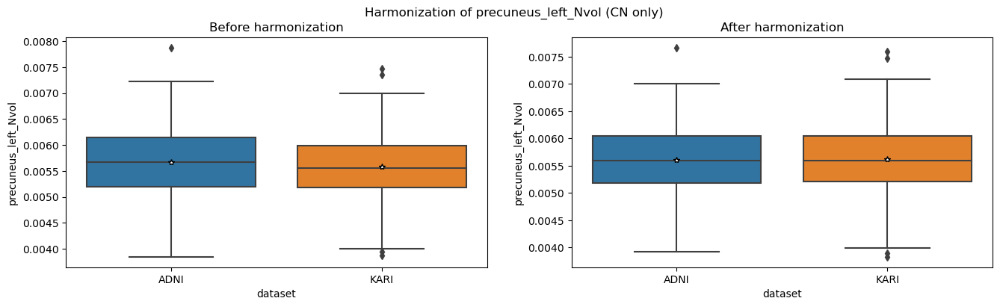

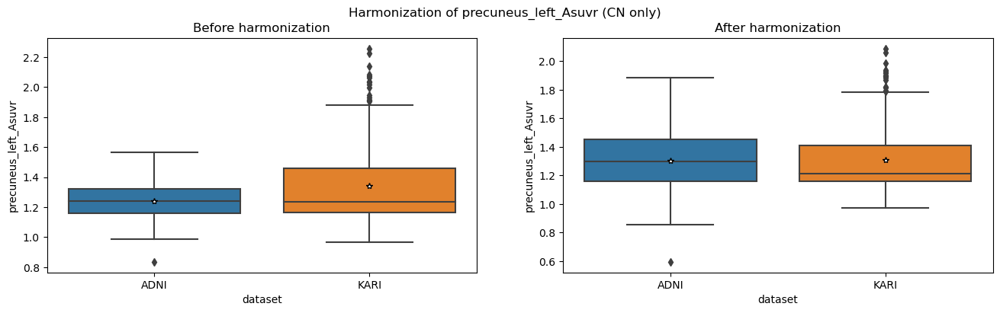

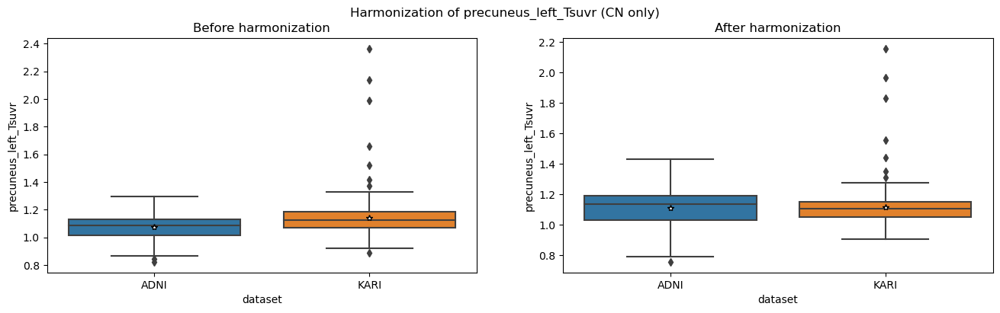

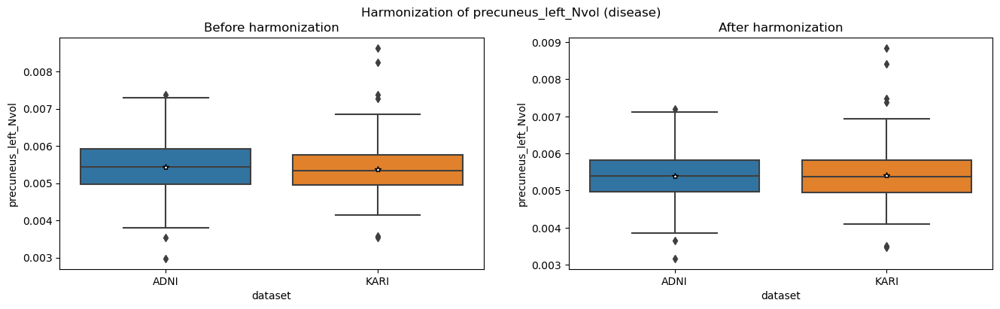

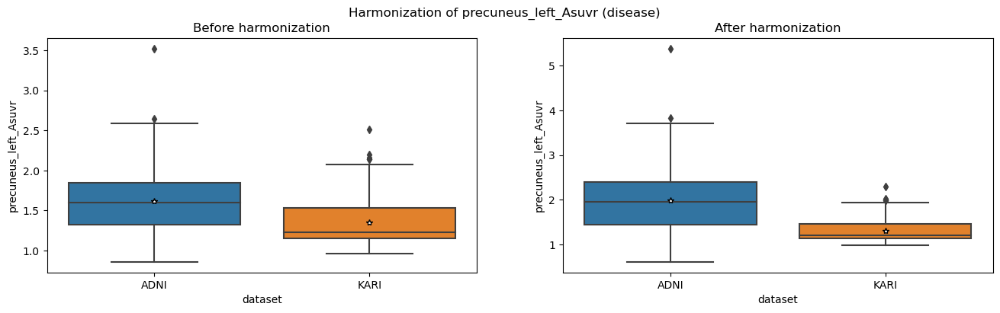

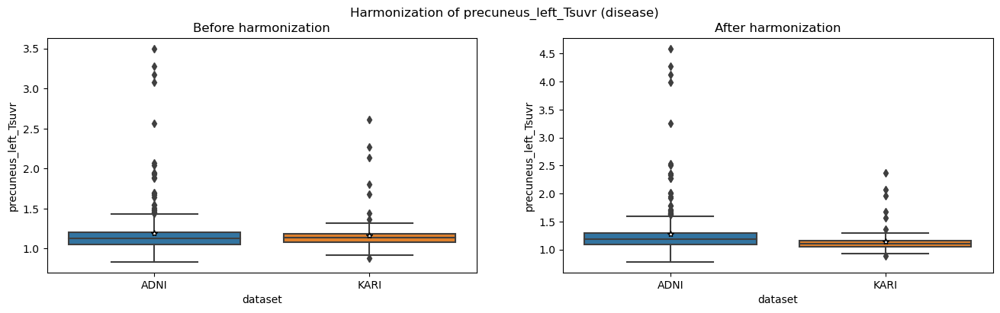

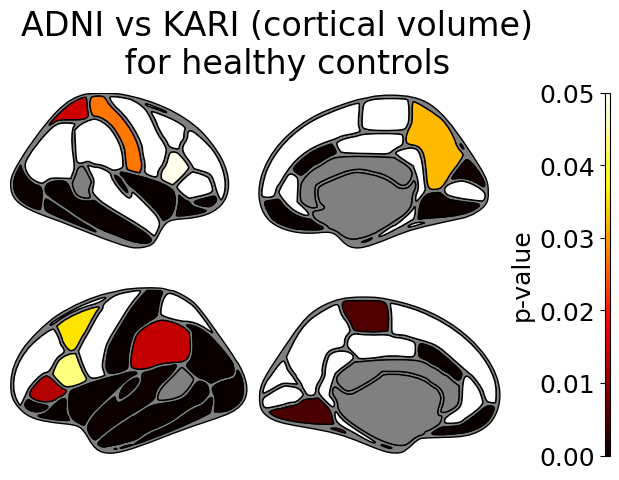

cort_CN (cortical) : Max = 0.9226871406452082, Min = 9.034012512088004e-149
MRI SUVR p-values after harmonization


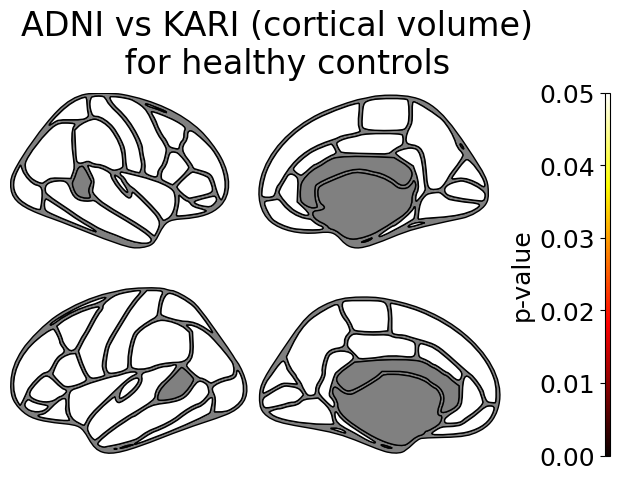

cort_CN (cortical) : Max = 0.9962032666444944, Min = 0.4002460111685975
Amyloid SUVR p-values before harmonization


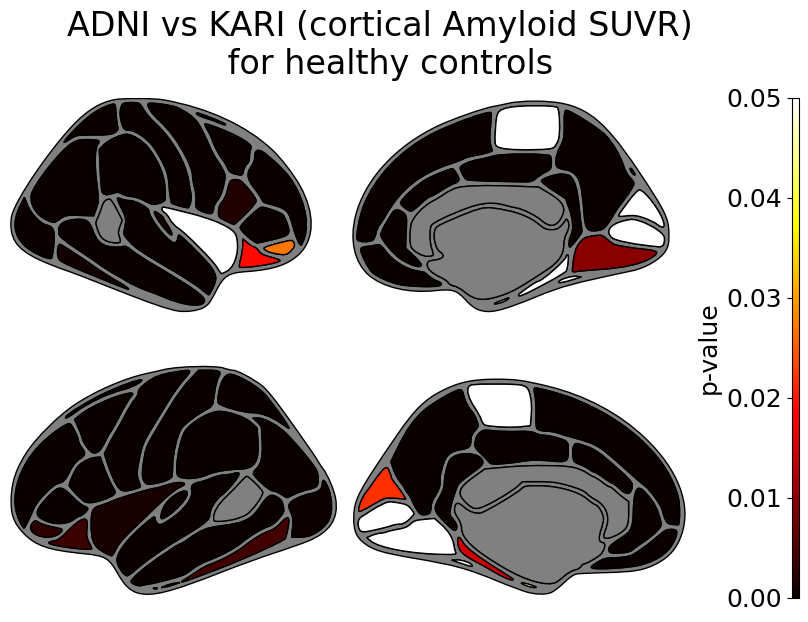

cort_CN (cortical) : Max = 0.96187140676903, Min = 6.494482754138884e-44


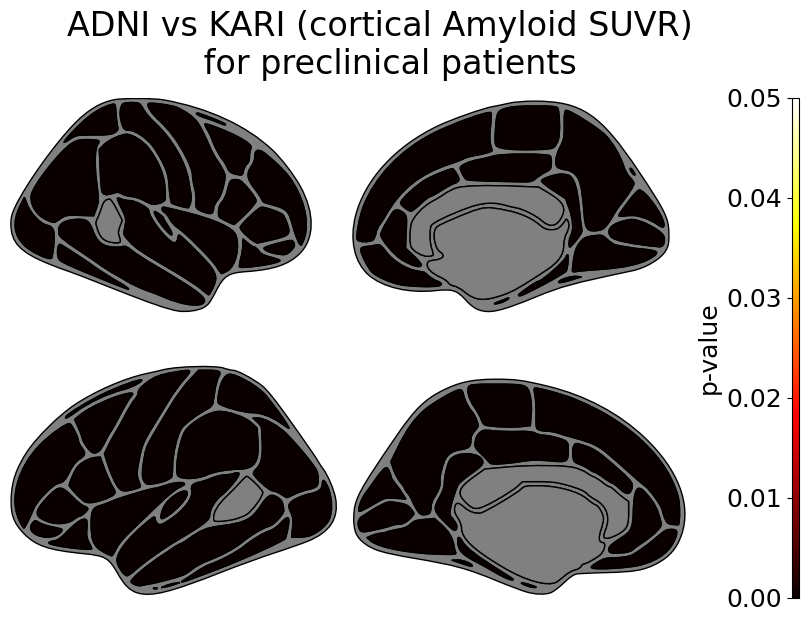

cort_precl (cortical) : Max = 0.7843503616464187, Min = 1.0618141078292943e-27


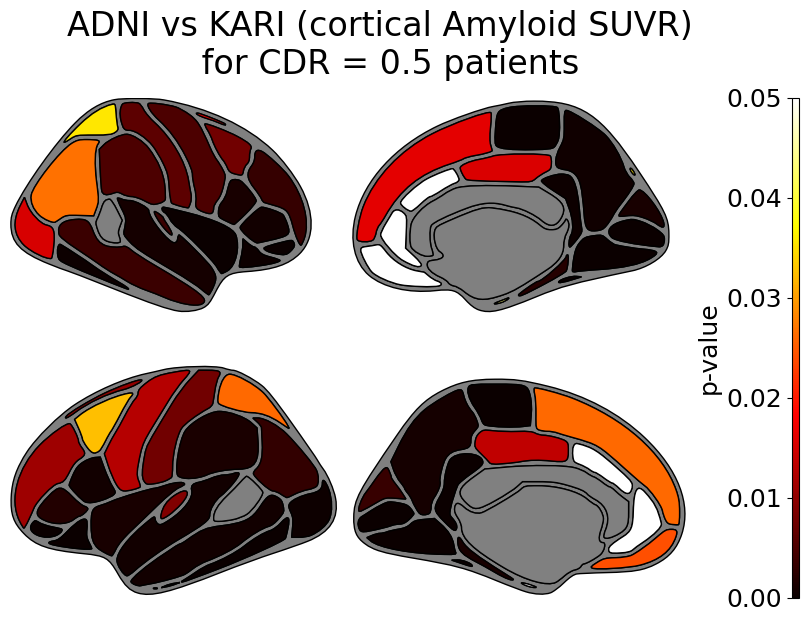

cort_cdr05 (cortical) : Max = 0.9481431437459689, Min = 3.7019743046642625e-09


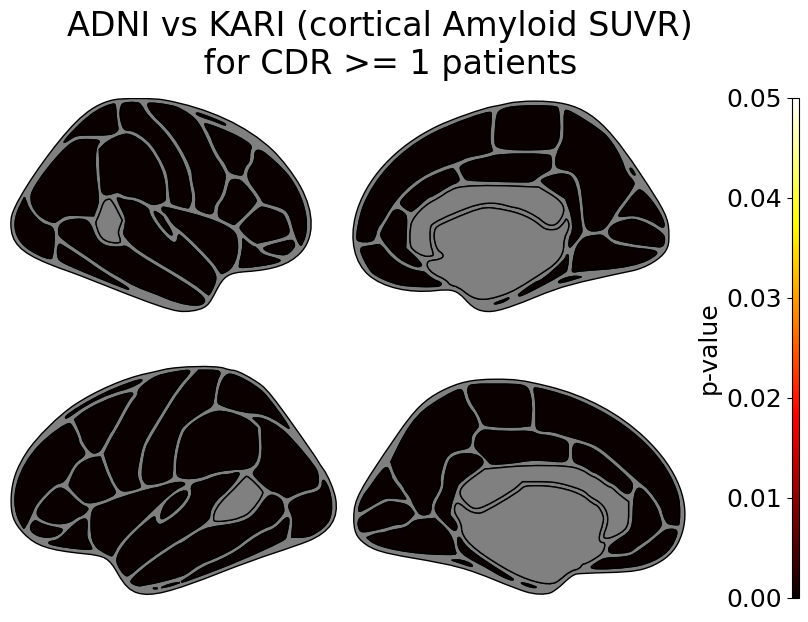

cort_cdr1 (cortical) : Max = 0.8717906514906788, Min = 0.00034374153671005205
Amyloid SUVR p-values after harmonization


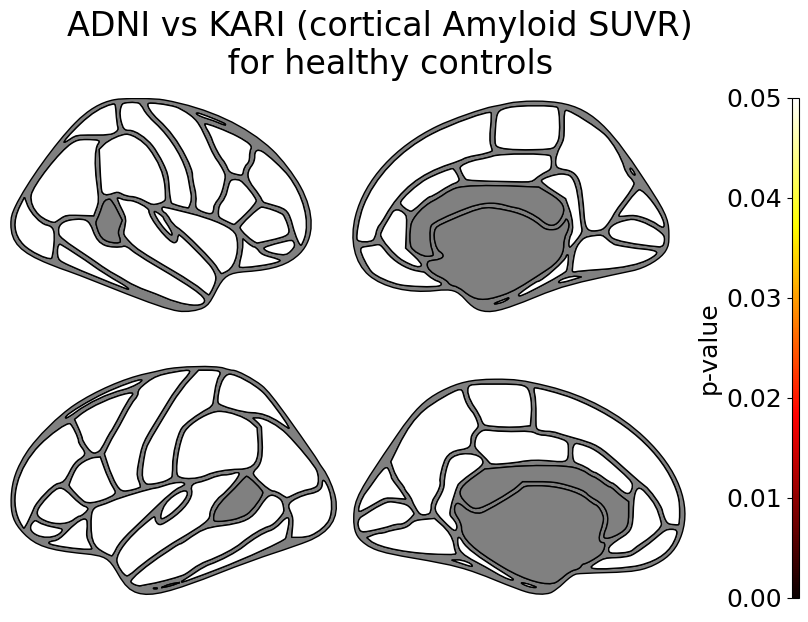

cort_CN (cortical) : Max = 0.9983623800994126, Min = 0.10101716646643072


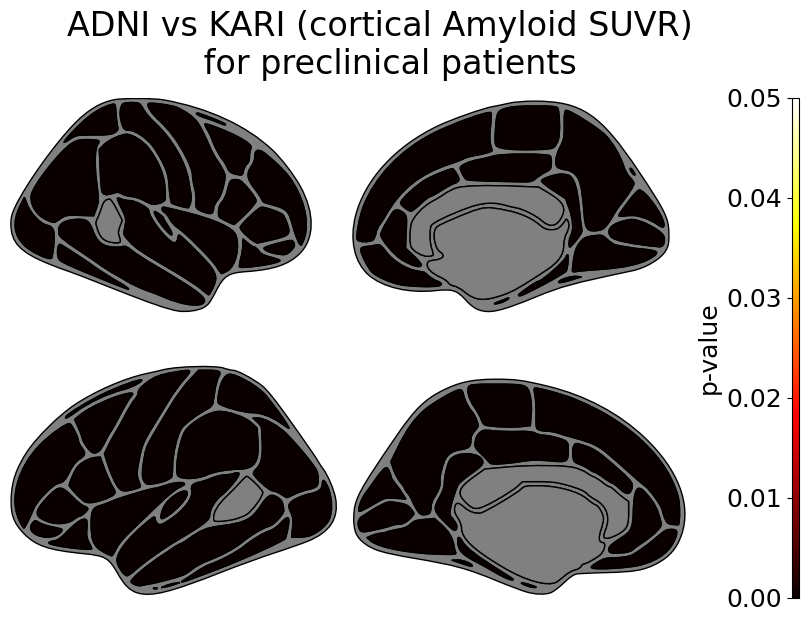

cort_precl (cortical) : Max = 0.7374786774037717, Min = 2.547275319928753e-40


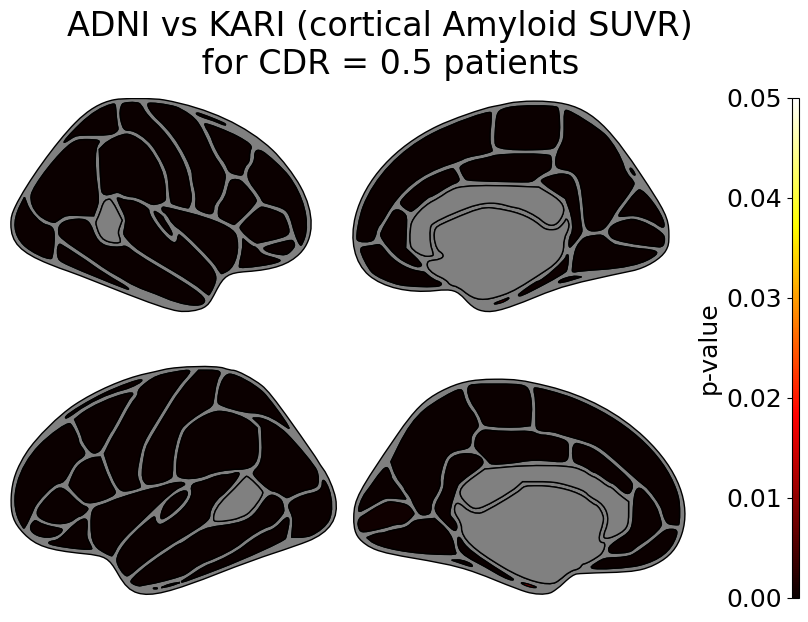

cort_cdr05 (cortical) : Max = 0.8617072975005597, Min = 2.750630007351479e-10


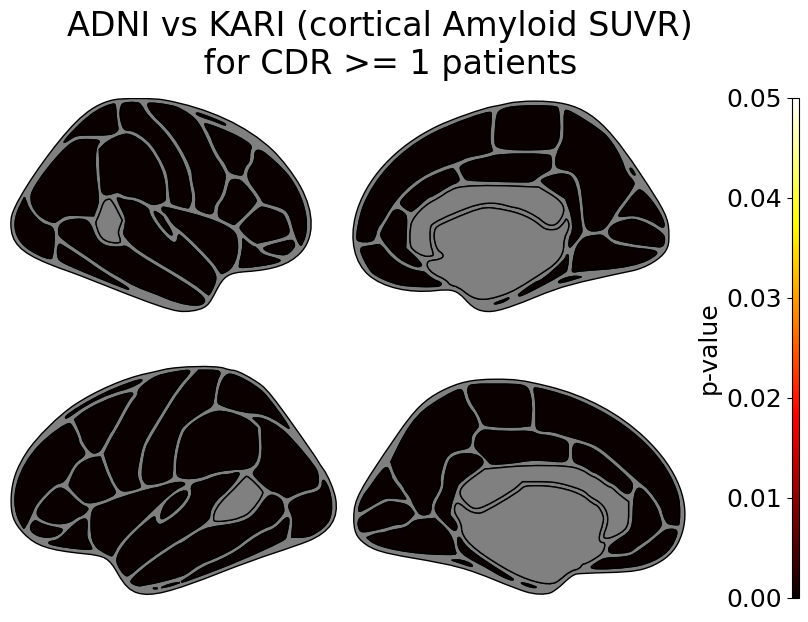

cort_cdr1 (cortical) : Max = 0.8553064336017384, Min = 6.103410246458953e-07
Tau SUVR p-values before harmonization


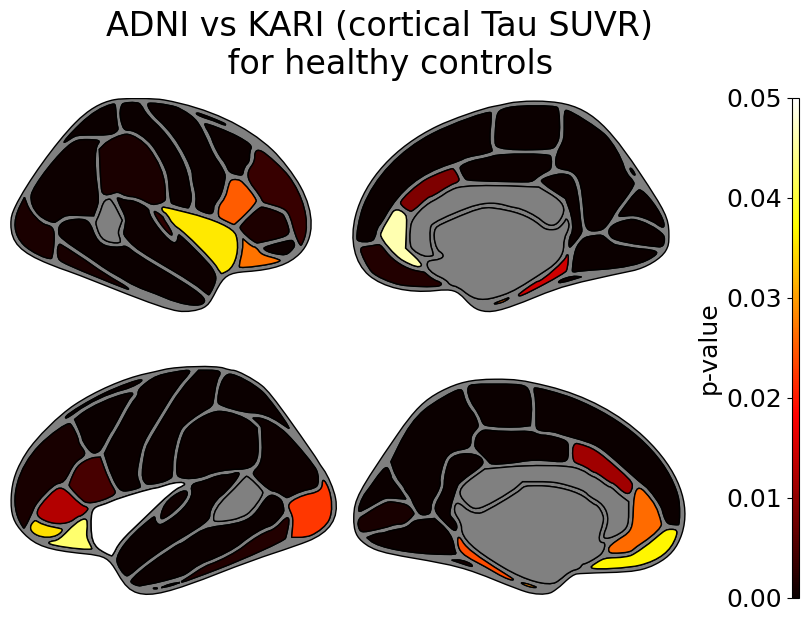

cort_CN (cortical) : Max = 0.8882407937387843, Min = 7.452747967061702e-14


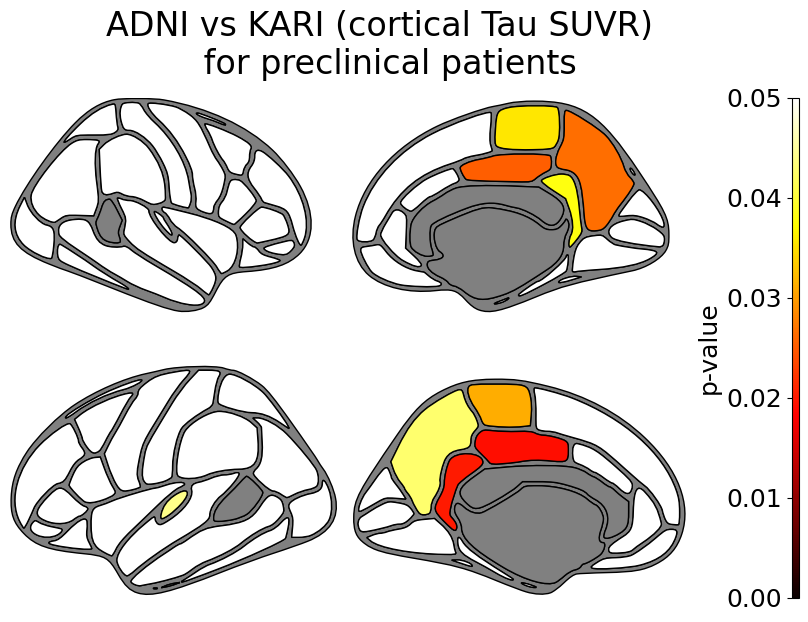

cort_precl (cortical) : Max = 0.9700139076561869, Min = 2.954848483940594e-05


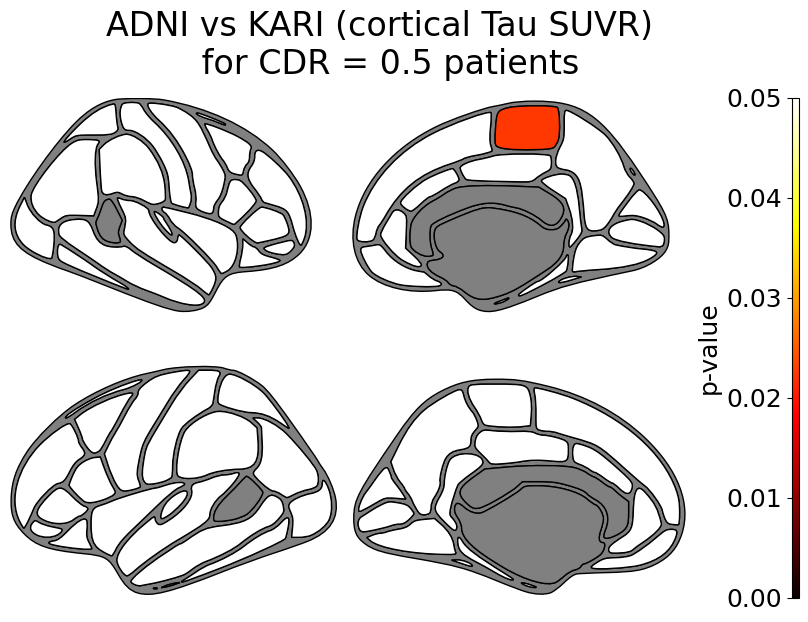

cort_cdr05 (cortical) : Max = 0.9686776599094985, Min = 7.405581176417893e-06


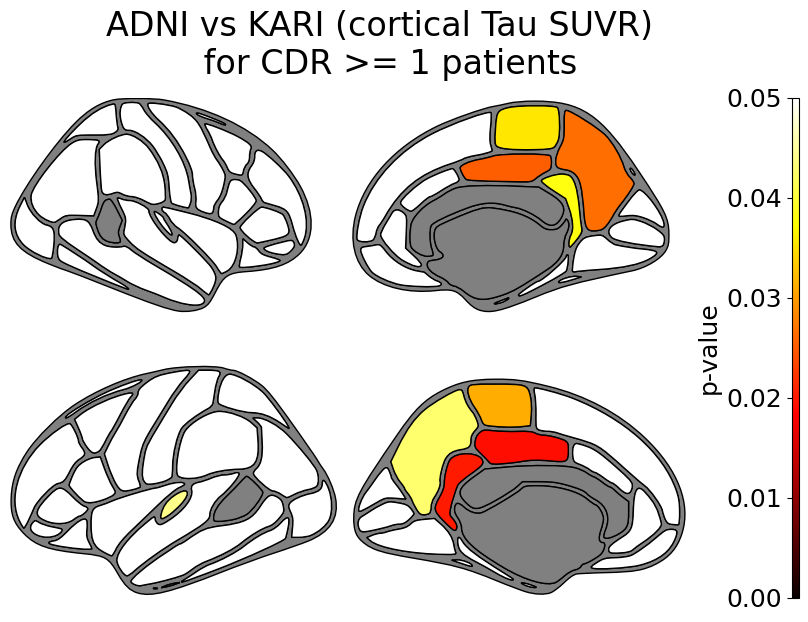

cort_cdr1 (cortical) : Max = 0.9962281428208694, Min = 0.004260077545577292
Tau SUVR p-values after harmonization


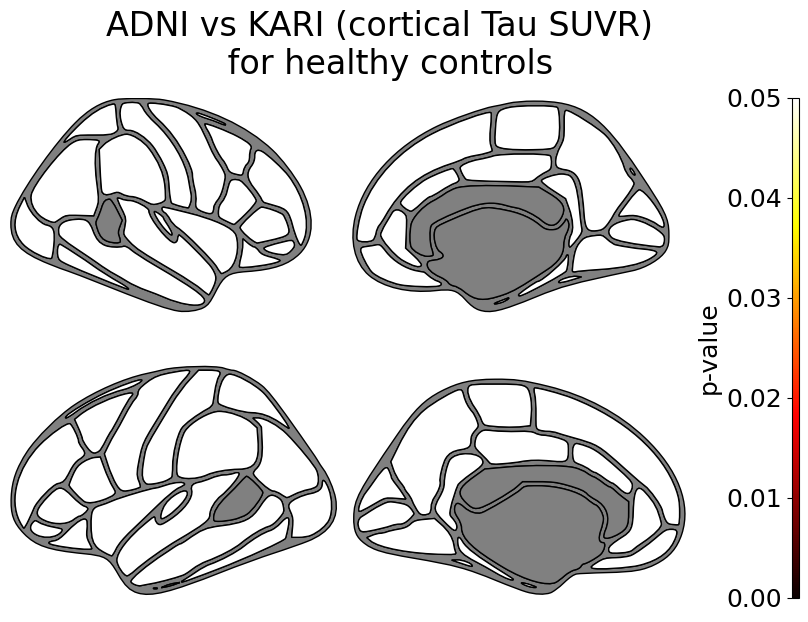

cort_CN (cortical) : Max = 0.9997599160185955, Min = 0.0032844831365881452


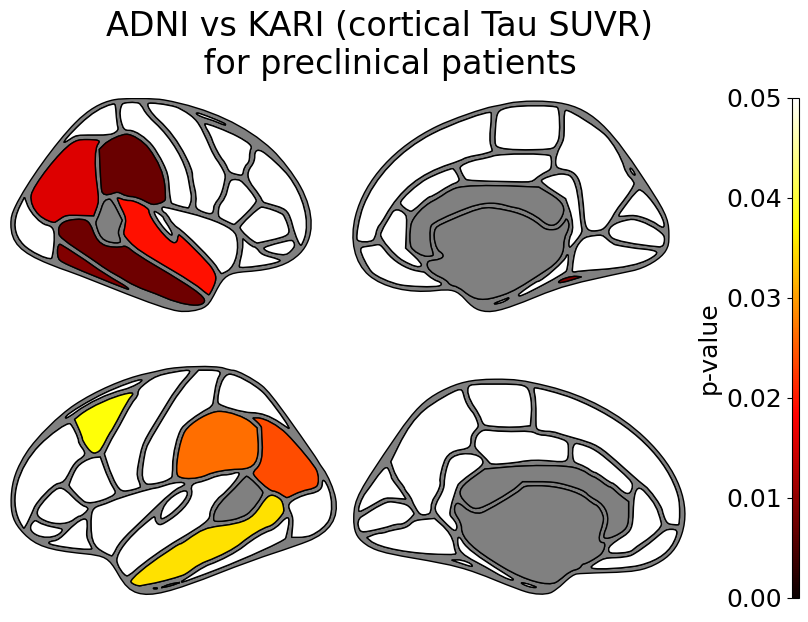

cort_precl (cortical) : Max = 0.9695736702730957, Min = 0.0071120239360151025


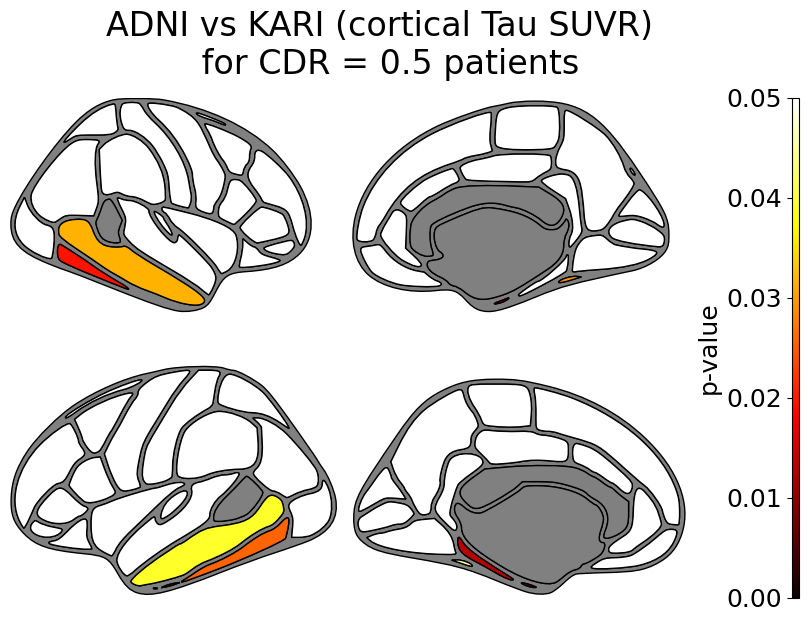

cort_cdr05 (cortical) : Max = 0.9736667518782541, Min = 0.0007776481491466755


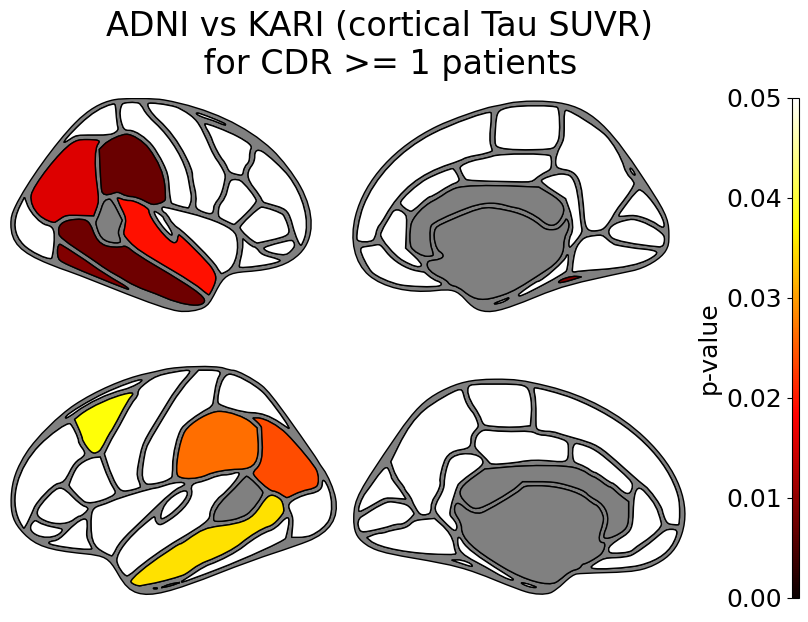

cort_cdr1 (cortical) : Max = 0.980248929858569, Min = 0.0028118014977434186


In [6]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


############################################
#--Option 1 : Learn COMBAT model on train data (healthy controls).  
#Apply pre-trained model on remaining disease patients
############################################

print('Option 1 : Learn COMBAT model on train data (healthy controls). Apply pre-trained model on remaining disease patients')

mri_harm_CN, amyloid_harm_CN, tau_harm_CN, mri_harm_rest, amyloid_harm_rest, tau_harm_rest, covars_CN, covars_rest = harmonization_step_stratify(a_n_merged, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols)
common_cols = ['ID', 'Age', 'Sex', 'MR_Date', 'CDR_Date', 'tau_present', 'amyloid_positive', 'amyloid_centiloid', 'cdr', 'stage', 'dataset']

##---------CN -----------
a_n_merged_CN = a_n_merged.loc[a_n_merged['stage'] == 'cdr = 0 amyloid negative'].reset_index(drop = True)

a_n_merged_harm_CN = a_n_merged_CN.copy()
a_n_merged_harm_CN[MRI_vol_cols] = mri_harm_CN
a_n_merged_harm_CN[amyloid_SUVR_cols] = amyloid_harm_CN
#a_n_merged_harm_CN[tau_SUVR_cols] = tau_harm_CN

tau_present_id_CN = a_n_merged_CN.loc[a_n_merged_CN.tau_present == 'yes'].ID.unique()
a_n_merged_tau_harm_CN = a_n_merged_harm_CN.loc[a_n_merged_harm_CN.ID.isin(tau_present_id_CN)].reset_index(drop = True)
a_n_merged_tau_harm_CN[tau_SUVR_cols] = tau_harm_CN

for i1 in range(len(a_n_merged_harm_CN)):
    for i2 in range(len(a_n_merged_tau_harm_CN)):
        if a_n_merged_harm_CN.loc[i1, 'ID'] == a_n_merged_tau_harm_CN.loc[i2, 'ID']:
            a_n_merged_harm_CN.loc[i1, tau_SUVR_cols] = a_n_merged_tau_harm_CN.loc[i2, tau_SUVR_cols]

a_n_merged_harm_CN =  a_n_merged_harm_CN[common_cols + MRI_vol_cols + amyloid_SUVR_cols + tau_SUVR_cols]

##---------disease -----------
a_n_merged_rest = a_n_merged.loc[a_n_merged['stage'] != 'cdr = 0 amyloid negative'].reset_index(drop = True)

a_n_merged_harm_rest = a_n_merged_rest.copy()
a_n_merged_harm_rest[MRI_vol_cols] = mri_harm_rest
a_n_merged_harm_rest[amyloid_SUVR_cols] = amyloid_harm_rest
#a_n_merged_harm_rest[tau_SUVR_cols] = tau_harm_rest

tau_present_id_rest = a_n_merged_rest.loc[a_n_merged_rest.tau_present == 'yes'].ID.unique()
a_n_merged_tau_harm_rest = a_n_merged_harm_rest.loc[a_n_merged_harm_rest.ID.isin(tau_present_id_rest)].reset_index(drop = True)
a_n_merged_tau_harm_rest[tau_SUVR_cols] = tau_harm_rest

for i1 in range(len(a_n_merged_harm_rest)):
    for i2 in range(len(a_n_merged_tau_harm_rest)):
        if a_n_merged_harm_rest.loc[i1, 'ID'] == a_n_merged_tau_harm_rest.loc[i2, 'ID']:
            a_n_merged_harm_rest.loc[i1, tau_SUVR_cols] = a_n_merged_tau_harm_rest.loc[i2, tau_SUVR_cols]

a_n_merged_harm_rest =  a_n_merged_harm_rest[common_cols + MRI_vol_cols + amyloid_SUVR_cols + tau_SUVR_cols]

plot_harmonization_effect(a_n_merged_CN, a_n_merged_harm_CN, a_n_merged_rest, a_n_merged_harm_rest, 'precuneus_left_Nvol', 'precuneus_left_Asuvr', 'precuneus_left_Tsuvr')

a_n_merged_harm = pd.concat([a_n_merged_harm_CN, a_n_merged_harm_rest]).reset_index(drop = True)

# plt.subplots(figsize = (16,4))
# plt.subplot(1,2,1)
# plt.title('Before harmonization')
# sns.boxplot(y=a_n_merged['precuneus_left_Nvol'], x=a_n_merged["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.subplot(1,2,2)
# plt.title('After harmonization')
# sns.boxplot(y=a_n_merged_harm['precuneus_left_Nvol'], x=a_n_merged_harm["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.suptitle('Harmonization of {} (healthy controls + diseae)'.format('precuneus_left_Nvol'))


# plt.subplots(figsize = (16,4))
# plt.subplot(1,2,1)
# plt.title('Before harmonization')
# sns.boxplot(y=a_n_merged['precuneus_left_Asuvr'], x=a_n_merged["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.subplot(1,2,2)
# plt.title('After harmonization')
# sns.boxplot(y=a_n_merged_harm['precuneus_left_Asuvr'], x=a_n_merged_harm["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.suptitle('Harmonization of {} (healthy controls + diseae)'.format('precuneus_left_Asuvr'))

# plt.subplots(figsize = (16,4))
# plt.subplot(1,2,1)
# plt.title('Before harmonization')
# sns.boxplot(y=a_n_merged['precuneus_left_Tsuvr'], x=a_n_merged["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.subplot(1,2,2)
# plt.title('After harmonization')
# sns.boxplot(y=a_n_merged_harm['precuneus_left_Tsuvr'], x=a_n_merged_harm["dataset"], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.suptitle('Harmonization of {} (healthy controls + diseae)'.format('precuneus_left_Tsuvr'))

#------------------------------------------

print('MRI SUVR p-values before harmonization')
p_mri_CN, p_mri_precl, p_mri_cdr05, p_mri_cdr1 = plot_p_maps_MRI_harm(a_n_merged_CN, a_n_merged_rest, common_cols, MRI_vol_cols)

print('MRI SUVR p-values after harmonization')
p_mri_harm_CN, p_mri_harm_precl, p_mri_harm_cdr05, p_mri_harm_cdr1 = plot_p_maps_MRI_harm(a_n_merged_harm_CN, a_n_merged_harm_rest, common_cols, MRI_vol_cols)

#--------------------------------------------

print('Amyloid SUVR p-values before harmonization')
p_amyloid_CN, p_amyloid_precl, p_amyloid_cdr05, p_amyloid_cdr1 = plot_p_maps_amyloid_harm(a_n_merged_CN, a_n_merged_rest, common_cols, amyloid_SUVR_cols)

print('Amyloid SUVR p-values after harmonization')
p_amyloid_harm_CN, p_amyloid_harm_precl, p_amyloid_harm_cdr05, p_amyloid_harm_cdr1 = plot_p_maps_amyloid_harm(a_n_merged_harm_CN, a_n_merged_harm_rest, common_cols, amyloid_SUVR_cols)

#--------------------------

print('Tau SUVR p-values before harmonization')
p_tau_CN, p_tau_precl, p_tau_cdr05, p_tau_cdr1  = plot_p_maps_tau_harm(a_n_merged_CN, a_n_merged_rest, common_cols, tau_SUVR_cols)

print('Tau SUVR p-values after harmonization')
p_tau_harm_CN, p_tau_harm_precl, p_tau_harm_cdr05, p_tau_harm_cdr1 = plot_p_maps_tau_harm(a_n_merged_harm_CN, a_n_merged_harm_rest, common_cols, tau_SUVR_cols)




# Get multimodal data ready for mmVAE

In [7]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'


# df1 = a_n_merged_harm
# df2 = a_n_merged_harm_tau
# a_n_merged_harm.loc[a_n_merged_harm.ID.isin(a_n_merged_harm_tau.ID), tau_SUVR_cols] = a_n_merged_harm_tau[tau_SUVR_cols]
# roi_demo_both = a_n_merged_harm.copy()

## If selecting all 3 modalities, else ignore this step
#roi_demo_both = a_n_merged_harm.loc[a_n_merged_harm.tau_present == 'yes'].reset_index(drop = True)
#roi_demo_both[tau_SUVR_cols] = tau_harm[tau_SUVR_cols]

roi_demo_both = a_n_merged_harm.loc[(a_n_merged_harm.tau_present == 'yes')].reset_index(drop = True)

roi_demo_both.loc[roi_demo_both.Sex == 0, 'Sex'] = 'Female'
roi_demo_both.loc[roi_demo_both.Sex == 1, 'Sex'] = 'Male'
roi_demo_both['Age'] = round(roi_demo_both['Age'])

age_df = pd.DataFrame(one_hot_encoding(roi_demo_both, 'Age'), index = roi_demo_both.index.values)
age_mat = one_hot_encoding(roi_demo_both, 'Age')

sex_df = pd.DataFrame(one_hot_encoding(roi_demo_both, 'Sex'), index = roi_demo_both.index.values)
sex_mat = one_hot_encoding(roi_demo_both, 'Sex')

site_df = pd.DataFrame(one_hot_encoding(roi_demo_both, 'dataset'), index = roi_demo_both.index.values)
site_mat = one_hot_encoding(roi_demo_both, 'dataset')

combine_arr = []
age_sex = []
for i in range(roi_demo_both.shape[0]):
    age_sex_val = np.matmul(sex_mat[i].reshape(-1,1), age_mat[i].reshape(-1,1).T).flatten().reshape(-1,1)
    age_sex.append(age_sex_val)
    
    age_sex_site_val = np.matmul(age_sex[i], site_mat[i].reshape(-1,1).T).flatten().reshape(-1,1)
    combine_arr.append(age_sex_site_val)

combine_mat = np.hstack(np.array(combine_arr)).T

age_sex_df = pd.DataFrame(np.hstack(np.array(age_sex)).T, index = roi_demo_both.index.values)


#age_sex_site_df = pd.DataFrame(combine_mat, index = roi_demo_both.index.values)

age_sex_site_df = pd.DataFrame(np.concatenate((age_mat, sex_mat, site_mat), axis=1), index = roi_demo_both.index.values)

#------------------------------------------------

only_CN = roi_demo_both.loc[roi_demo_both.stage == 'cdr = 0 amyloid negative']
rest = roi_demo_both.loc[roi_demo_both['stage'] != 'cdr = 0 amyloid negative']

y_CN = only_CN['stage']
y_rest = rest['stage']

only_CN_test = only_CN.sample(n=round(0.15*len(only_CN)), random_state=1)
CN_model, CN_held_val = train_test_split(only_CN.loc[~only_CN.ID.isin(only_CN_test.ID.values)], test_size=0.2, shuffle = False, random_state = 1000)

X_test_org = pd.concat([rest, only_CN_test]).copy().reset_index(drop = True)

print('Number of CN used for model training/val: {}'.format(len(CN_model)))
print('Number of CN used for normalization: {}'.format(len(CN_held_val)))
print('Number of CN used in test set: {}'.format(len(only_CN_test)))
print('Number of disease patients used in test set: {}'.format(len(rest)))




Number of CN used for model training/val: 240
Number of CN used for normalization: 61
Number of CN used in test set: 53
Number of disease patients used in test set: 381


# mmVAE training and testing

Number of training samples: 216
Number of validation samples: 24
--- 97.98319411277771 seconds ---


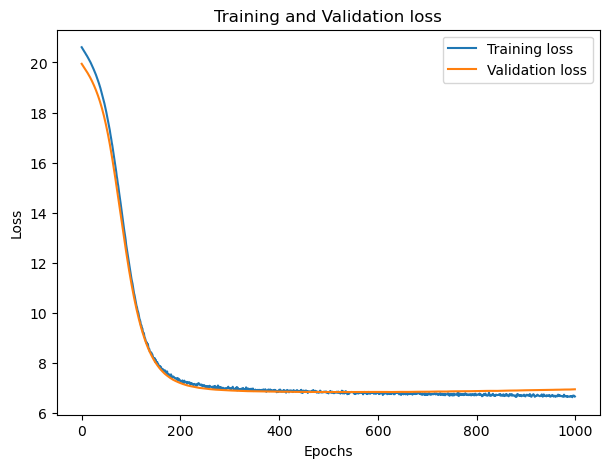

In [8]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/relevant_functions_ATN.ipynb'


import time
start_time = time.time()

k = 1
params = {'batch_size':64, 'lr':5e-5, 'latent_dim':32, 'alpha_1':1, 'alpha_2':1, 'alpha_3':1, 'beta':1, 'epochs':1000}
common_cols = ['ID', 'Age', 'Sex', 'tau_present', 'amyloid_positive', 'amyloid_centiloid', 'cdr', 'stage', 'dataset']

model, train_loss, val_loss, X_org_val, X_pred_val, dev_bvae, X_valho_org, X_pred_valho, X_pred_test, X_test_total = complete_training_prediction(CN_model, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols, common_cols, age_sex_site_df, params)


# #----------------------------------------------
# cat = ['cdr = 0 amyloid negative', 'cdr = 0 amyloid positive', 'cdr = 0.5', 'cdr >= 1']
# slope = calculate_slope_model(cat, dev_bvae)

# temp_dev_bvae = dev_bvae.copy()
# temp_dev_bvae['label'] = 'mmVAE' + '(slope = ' + str(slope) + ')'
# plt.figure(figsize = (10,5))
# sns.boxplot(x = 'stage', y = 'mean_dev_all', hue = 'label', data = temp_dev_bvae, order = ['cdr = 0 amyloid negative', 'cdr = 0 amyloid positive', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.xlabel('Disease category', fontsize = 16)
# plt.ylabel('Mean deviation (Z-scores) \n across all brain regions', fontsize = 16)
# plt.yticks(fontsize = 16)
# plt.xticks(ticks = [0,1,2,3], labels=['cdr = 0 \n amyloid negative', 'cdr = 0 \n amyloid positive', 'cdr = 0.5', 'cdr >= 1'], fontsize = 14)
# plt.legend(fontsize = 16)
# plt.title('Disease staging (multimodal)', fontsize = 18)

# fs_cols = MRI_vol_cols + amyloid_SUVR_cols + tau_SUVR_cols
# recon['mean_recon_all'] = (abs((recon[fs_cols])).sum(axis = 1).to_numpy()/recon[fs_cols].shape[1])
# plt.figure(figsize = (10,4))
# sns.boxplot(x = 'stage', y = 'mean_recon_all', data = recon, order = ['cdr = 0 amyloid negative', 'cdr = 0 amyloid positive', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black'})
# plt.xlabel('Disease category', fontsize = 16)
# plt.ylabel('Mean reconstruction loss \n for all modalities', fontsize = 16)
# plt.yticks(fontsize = 16)
# plt.xticks(ticks = [0,1,2,3], labels=['cdr = 0 \n amyloid negative', 'cdr = 0 \n amyloid positive', 'cdr = 0.5', 'cdr >= 1'], fontsize = 14)
# plt.title('Mean reconstruction loss \n (all modalities)', fontsize = 18)

plt.figure(figsize = (7,5))
epochs = range(len(train_loss))
plt.plot(epochs, train_loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation loss')
plt.legend()

print("--- %s seconds ---" % (time.time() - start_time))


## Patient-level mean deviations across disease stages

### Percentage of regions with positive deviations

In [9]:
#all_atn_kari.to_csv('./saved_dataframes/all_atn_kari.csv')

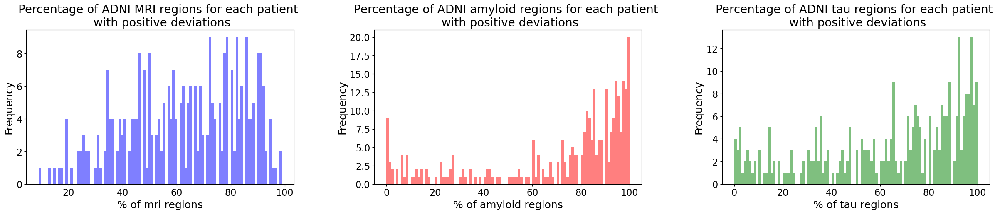

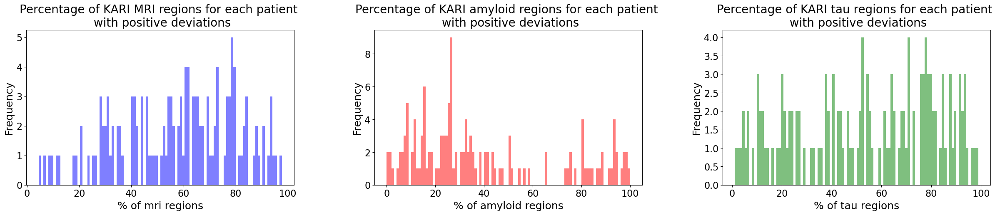

In [10]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

temp_dev_mmvae = dev_bvae.copy()
#temp_dev_mmvae = temp_dev_mmvae.loc[(temp_dev_mmvae.stage == 'cdr = 0 amyloid negative') | (temp_dev_mmvae.amyloid_positive == 1)].reset_index(drop = True)

count_true_deviations(temp_dev_mmvae, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols)


### Mean deviations for each patient across (a) all regions and (b) only significant regions

ADNI
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

HC v.s. preclinical: Kruskal-Wallis paired samples with Bonferroni correction, P_val=1.000e+00 stat=8.330e-01
preclinical v.s. cdr = 0.5: Kruskal-Wallis paired samples with Bonferroni correction, P_val=3.019e-05 stat=1.950e+01
cdr = 0.5 v.s. cdr >= 1: Kruskal-Wallis paired samples with Bonferroni correction, P_val=3.317e-02 stat=6.456e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

HC v.s. preclinical: Kruskal-Wallis paired samples with Bonferroni correction, P_val=6.994e-12 stat=4.918e+01
preclinical v.s. cdr = 0.5: Kruskal-Wallis paired samples with Bonferroni correction, P_val=2.766e-03 stat=1.098e+01
cdr = 0.5 v.s. cdr >= 1: Kruskal-Wallis paired samples with Bonferroni correction, P_val=1.000e+00 

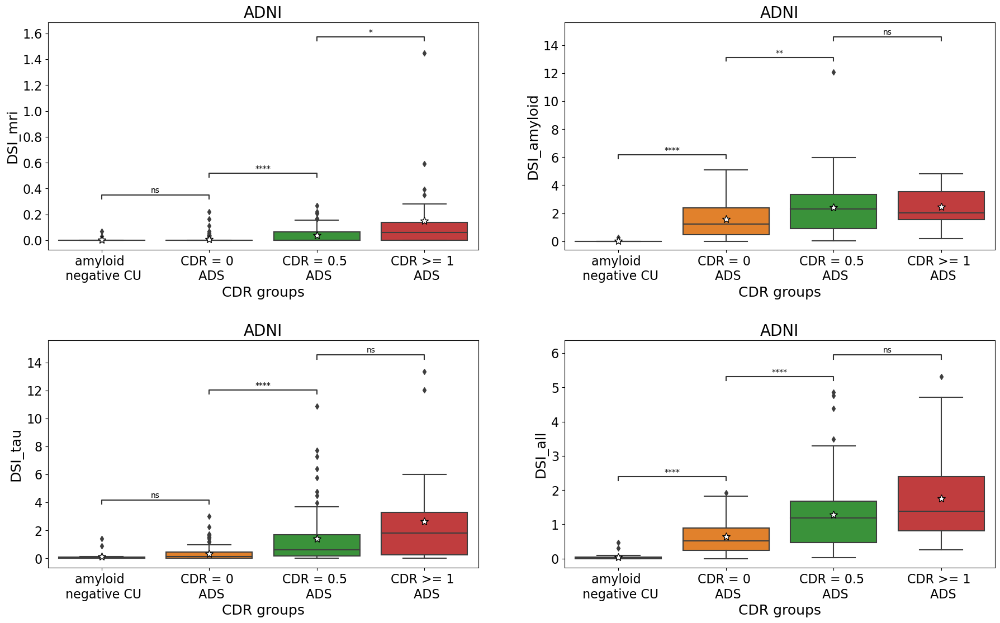

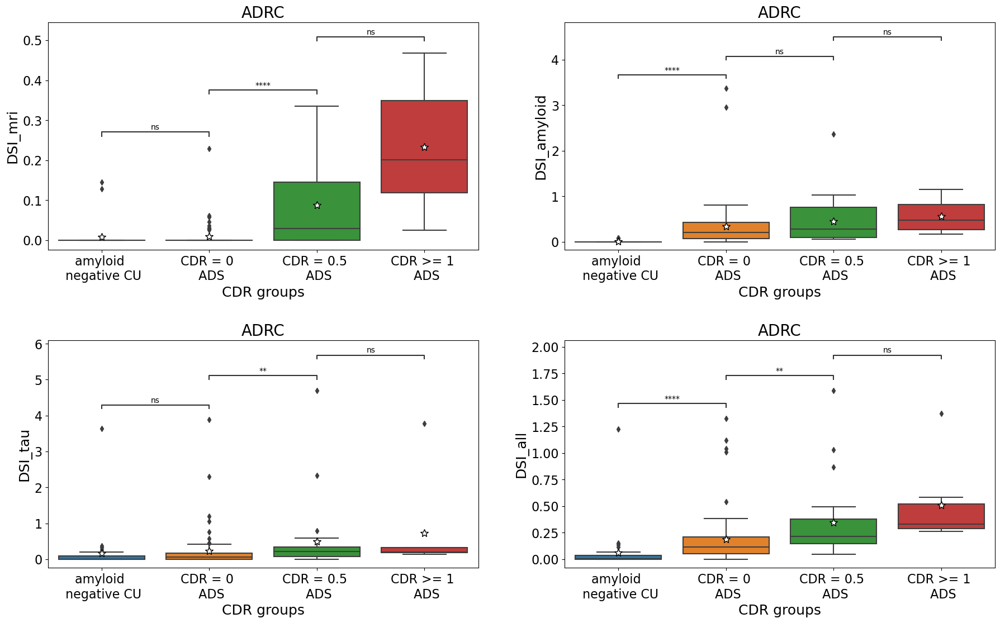

In [11]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

from statannot import add_stat_annotation
from scipy.stats import norm

temp_dev_mmvae = dev_bvae.copy()
temp_dev_mmvae = temp_dev_mmvae.loc[(temp_dev_mmvae.stage == 'cdr = 0 amyloid negative') | (temp_dev_mmvae.amyloid_positive == 1)].reset_index(drop = True)
temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0 amyloid negative', 'stage'] = 'HC'
temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0 amyloid positive', 'stage'] = 'preclinical'

fs_cols = MRI_vol_cols + amyloid_SUVR_cols + tau_SUVR_cols

p_values_mri = pd.DataFrame(norm.cdf(temp_dev_mmvae[MRI_vol_cols]), columns = MRI_vol_cols)
p_values_amyloid = pd.DataFrame(1-norm.cdf(temp_dev_mmvae[amyloid_SUVR_cols]), columns = amyloid_SUVR_cols)
p_values_tau = pd.DataFrame(1-norm.cdf(temp_dev_mmvae[tau_SUVR_cols]), columns = tau_SUVR_cols)

p_values_all = pd.concat([p_values_mri, p_values_amyloid, p_values_tau], axis = 1)

adjusted_p_values = np.zeros_like(p_values_all)
for i in range(p_values_all.shape[1]):
    #adjusted_p_values[:, i] = multipletests(p_values_all.to_numpy()[:, i], method='fdr_bh')[1]
    adjusted_p_values[:, i] = fdrcorrection(p_values_all.to_numpy()[:, i], method='indep', alpha = 0.1)[1]
    
    
# rejected, adjusted_p_values = fdrcorrection(p_values_all.to_numpy().flatten(), alpha=0.1)
# adjusted_p_values = adjusted_p_values.reshape(p_values_all.shape)

adjusted_p_values = pd.DataFrame(adjusted_p_values, columns = fs_cols)

reject_corr = adjusted_p_values[fs_cols].copy()
for idx in adjusted_p_values.index.values:
    for col in fs_cols:
        if adjusted_p_values[fs_cols].loc[idx, col] < 0.1:
            reject_corr.loc[idx, col] = 1
        else :
            reject_corr.loc[idx, col] = 0

temp_dev_mmvae['mean_dev_mri_sig_fdr'] = abs(temp_dev_mmvae[MRI_vol_cols].mul(reject_corr[MRI_vol_cols]).mean(axis = 1))
temp_dev_mmvae['mean_dev_amyloid_sig_fdr'] = temp_dev_mmvae[amyloid_SUVR_cols].mul(reject_corr[amyloid_SUVR_cols]).mean(axis = 1)
temp_dev_mmvae['mean_dev_tau_sig_fdr'] = temp_dev_mmvae[tau_SUVR_cols].mul(reject_corr[tau_SUVR_cols]).mean(axis = 1)
temp_dev_mmvae['mean_dev_all_sig_fdr'] = (temp_dev_mmvae['mean_dev_mri_sig_fdr'] + temp_dev_mmvae['mean_dev_amyloid_sig_fdr'] + temp_dev_mmvae['mean_dev_tau_sig_fdr'])/3

for dataset in ['ADNI', 'KARI']:
    
    print(dataset)
    
    df = temp_dev_mmvae.loc[temp_dev_mmvae.dataset == dataset].reset_index(drop = True)
    
    plt.subplots(figsize = (18, 12))

    plt.subplot(2,2,1)
    sns.boxplot(x = 'stage', y = 'mean_dev_mri_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_mri_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                    box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                    test='Kruskal', text_format='star', loc='inside', verbose=1)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_mri', fontsize = 18)
    plt.yticks(fontsize = 16)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    #plt.legend(fontsize = 20)
    if dataset == 'ADNI':
        plt.title('ADNI', fontsize = 20)
        
    if dataset == 'KARI':
        plt.title('ADRC', fontsize = 20)

    plt.subplot(2,2,2)
    sns.boxplot(x = 'stage', y = 'mean_dev_amyloid_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_amyloid_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                    box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                    test='Kruskal', text_format='star', loc='inside', verbose=1)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_amyloid', fontsize = 18)
    plt.yticks(fontsize = 16)
    #plt.legend(fontsize = 20)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    if dataset == 'ADNI':
        plt.title('ADNI', fontsize = 20)
        
    if dataset == 'KARI':
        plt.title('ADRC', fontsize = 20)

    plt.subplot(2,2,3)
    sns.boxplot(x = 'stage', y = 'mean_dev_tau_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_tau_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                    box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                    test='Kruskal', text_format='star', loc='inside', verbose=1)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_tau', fontsize = 18)
    plt.yticks(fontsize = 16)
    #plt.legend(fontsize = 20)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    if dataset == 'ADNI':
        plt.title('ADNI', fontsize = 20)
        
    if dataset == 'KARI':
        plt.title('ADRC', fontsize = 20)

    plt.subplot(2,2,4)
    sns.boxplot(x = 'stage', y = 'mean_dev_all_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True,  meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_all_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                    box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                    test='Kruskal', text_format='star', loc='inside', verbose=1)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_all', fontsize = 18)
    plt.yticks(fontsize = 16)
    #plt.legend(fontsize = 20)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    if dataset == 'ADNI':
        plt.title('ADNI', fontsize = 20)
        
    if dataset == 'KARI':
        plt.title('ADRC', fontsize = 20)

    plt.tight_layout()
    #plt.suptitle('Patient-level disease severity across {} groups'.format(dataset), fontsize = 24)
    plt.subplots_adjust(top = 0.9, hspace= 0.4, wspace = 0.2)
    
    if dataset == 'ADNI':
        plt.savefig('/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Manuscript_sections/Plots/ADNI/DSI.pdf', bbox_inches = 'tight', dpi = 600)

    if dataset == 'KARI':
        plt.savefig('/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Manuscript_sections/Plots/KARI/DSI.pdf', bbox_inches = 'tight', dpi = 600)


#----------------------------------------------
# hc_dev = temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC']['mean_dev_all_sig_fdr']
# disease_dev = temp_dev_mmvae.loc[temp_dev_mmvae.stage != 'HC']['mean_dev_all_sig_fdr']

# print(len(hc_dev))
# print(len(disease_dev))

# num_out_disease_dev = len([x for x in disease_dev if x > 1.7])
# num_out_hc_dev = len([x for x in hc_dev if x > 1.7])

# #sig_ratio = (num_out_disease_dev/len(disease_dev))/ (num_out_hc_dev/len(hc_dev))



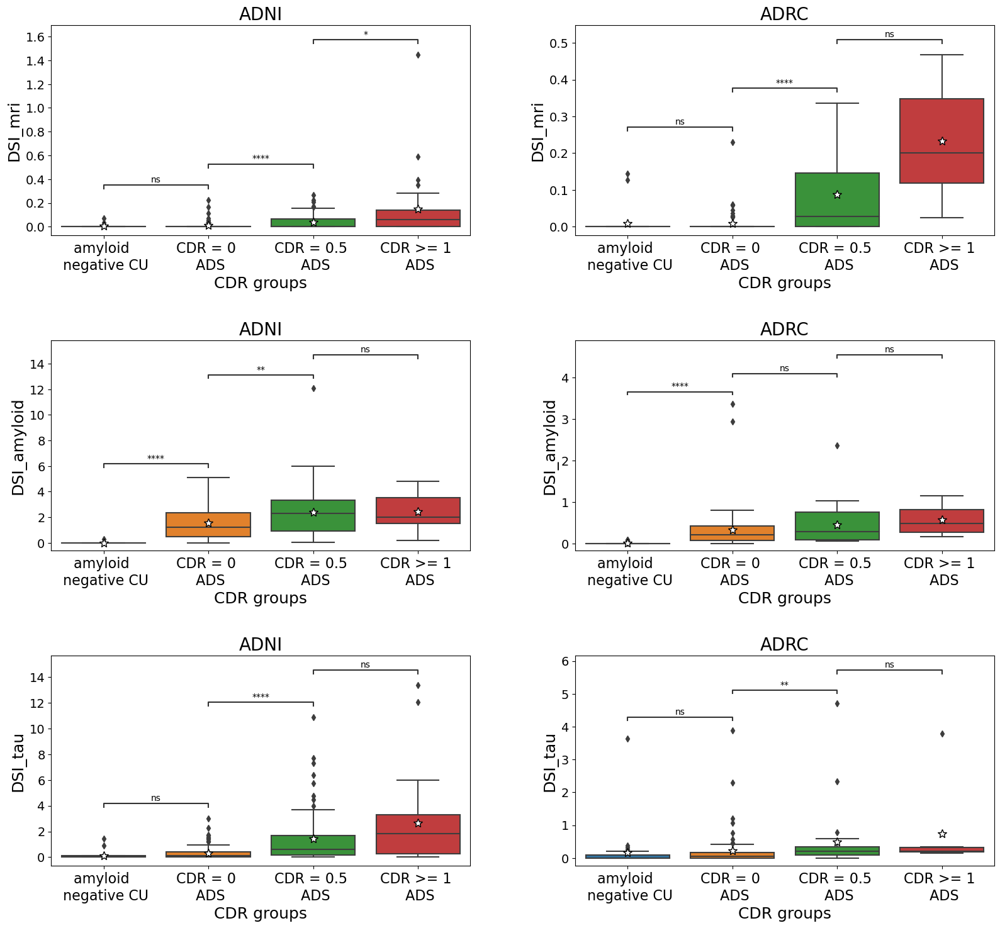

In [12]:
from statannot import add_stat_annotation

plt.subplots(figsize = (16, 16))
i = 1
for dataset in ['ADNI', 'KARI']:
    
    df = temp_dev_mmvae.loc[temp_dev_mmvae.dataset == dataset].reset_index(drop = True) 
    
    if dataset == 'ADNI':
        df.loc[df.dataset == 'ADNI', 'dataset'] = 'ADNI'
    else:
        df.loc[df.dataset == 'KARI', 'dataset'] = 'ADRC'
    
    plt.subplot(3,2,i)
    sns.boxplot(x = 'stage', y = 'mean_dev_mri_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_mri_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                        box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                        test='Kruskal', text_format='star', loc='inside', verbose=0)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_mri', fontsize = 18)
    plt.yticks(fontsize = 14)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    plt.title('{}'.format(df.dataset.unique()[0]), fontsize = 20)
    #-------------------------------
    
    plt.subplot(3,2,i+2)
    sns.boxplot(x = 'stage', y = 'mean_dev_amyloid_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_amyloid_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                        box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                        test='Kruskal', text_format='star', loc='inside', verbose=0)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_amyloid', fontsize = 18)
    plt.yticks(fontsize = 14)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    plt.title('{}'.format(df.dataset.unique()[0]), fontsize = 20)
    
    #-------------------------------
    
    plt.subplot(3,2,i+4)
    sns.boxplot(x = 'stage', y = 'mean_dev_tau_sig_fdr', data = df, order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'], showmeans=True, meanprops={'marker':'*', 'markerfacecolor':'white', 'markeredgecolor':'black', 'markersize': 10})
    add_stat_annotation(ax=plt.gca(), data=df, x='stage', y='mean_dev_tau_sig_fdr', order = ['HC', 'preclinical', 'cdr = 0.5', 'cdr >= 1'],
                        box_pairs=[("HC", "preclinical"), ("preclinical", "cdr = 0.5"), ("cdr = 0.5", "cdr >= 1")],
                        test='Kruskal', text_format='star', loc='inside', verbose=0)

    plt.xlabel('CDR groups', fontsize = 18)
    plt.ylabel('DSI_tau', fontsize = 18)
    plt.yticks(fontsize = 14)
    plt.xticks(ticks = [0,1,2,3], labels=['amyloid \n negative CU', 'CDR = 0 \n ADS', 'CDR = 0.5 \n ADS', 'CDR >= 1 \n ADS'], fontsize = 16)
    
    plt.title('{}'.format(df.dataset.unique()[0]), fontsize = 20)
    
    
    i = i + 1

plt.tight_layout()
plt.subplots_adjust(top = 0.9, hspace= 0.5, wspace = 0.25)
plt.savefig('/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Manuscript_sections/revised_version_SK/truncated_versions/Figures_tables/DSI_modality.pdf', bbox_inches = 'tight', dpi = 600)


In [13]:
from scipy import stats
from scipy.stats import f_oneway

def calculate_stats(array):
    
    median = np.mean(array)
    
    q75, q25 = np.percentile(array, [75 ,25])
    iqr = q75 - q25

    ci = stats.t.interval(0.95, len(array)-1, loc=np.mean(array), scale=stats.sem(array))
    
    print('Mean = {}, IQR = {}, 95% CI = {}'.format(median, iqr, ci))
    #return median, iqr, ci

calculate_stats(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC'].mean_dev_all_sig_fdr)
calculate_stats(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'preclinical'].mean_dev_all_sig_fdr)
calculate_stats(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0.5'].mean_dev_all_sig_fdr)
calculate_stats(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr >= 1'].mean_dev_all_sig_fdr)

def compare_group_means(*groups):
    f_value, p_value = f_oneway(*groups)
    return f_value, p_value

f_value_mri, p_value_mri = f_oneway(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC']['mean_dev_mri_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'preclinical']['mean_dev_mri_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0.5']['mean_dev_mri_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr >= 1']['mean_dev_mri_sig_fdr'].values)
f_value_amyloid, p_value_amyloid = f_oneway(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC']['mean_dev_amyloid_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'preclinical']['mean_dev_amyloid_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0.5']['mean_dev_amyloid_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr >= 1']['mean_dev_amyloid_sig_fdr'].values)
f_value_tau, p_value_tau = f_oneway(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC']['mean_dev_tau_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'preclinical']['mean_dev_tau_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0.5']['mean_dev_tau_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr >= 1']['mean_dev_tau_sig_fdr'].values)


#f_value_mri, p_value_mri = f_oneway(temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC']['mean_dev_amyloid_sig_fdr'].values, temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'cdr = 0.5']['mean_dev_amyloid_sig_fdr'].values)

#print("F-value MRI:", f_value_mri)
print("P-value MRI:", p_value_mri)
print("P-value amyloid:", p_value_amyloid)
print("P-value tau:", p_value_tau)


Mean = 0.05974205749889964, IQR = 0.037691675557128164, 95% CI = (0.009706536706192107, 0.10977757829160717)
Mean = 0.46057681091474223, IQR = 0.6198217996733916, 95% CI = (0.38555663556595676, 0.5355969862635277)
Mean = 1.0713902958660095, IQR = 1.2863958351009854, 95% CI = (0.8775932927595262, 1.2651872989724928)
Mean = 1.5204740996740398, IQR = 1.6198849857532407, 95% CI = (1.1201758294331954, 1.9207723699148842)
P-value MRI: 1.7262447258377877e-16
P-value amyloid: 2.9872265680220516e-16
P-value tau: 6.909661746221052e-15


## Regional deviation atlas maps across disease stages  

### Regional frequency of signifcance (outlier proportion) for each modality stratified by disease stages

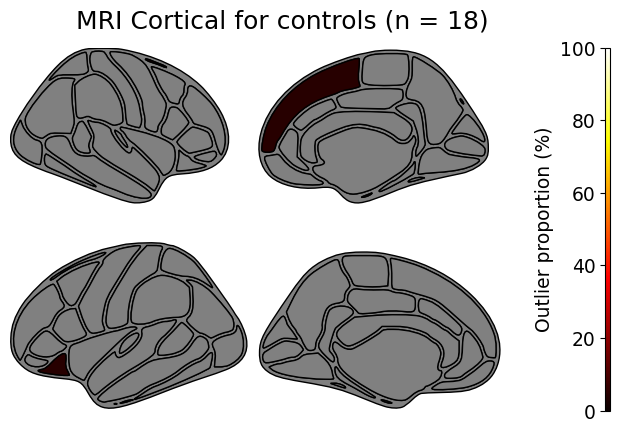

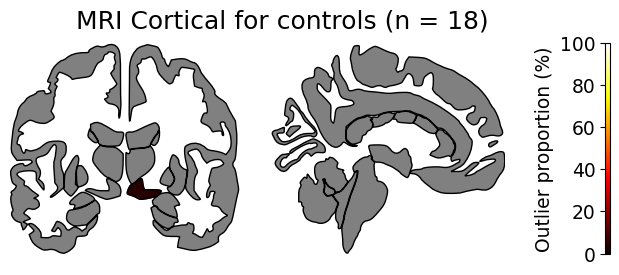

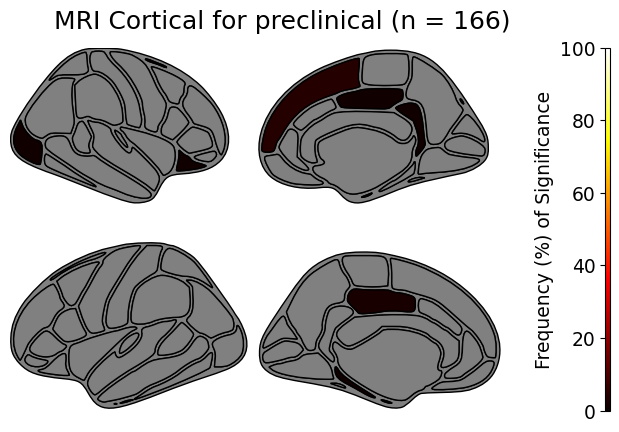

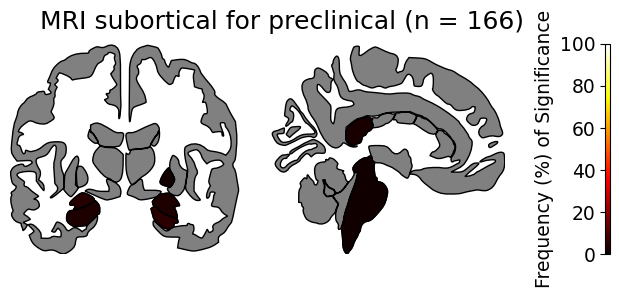

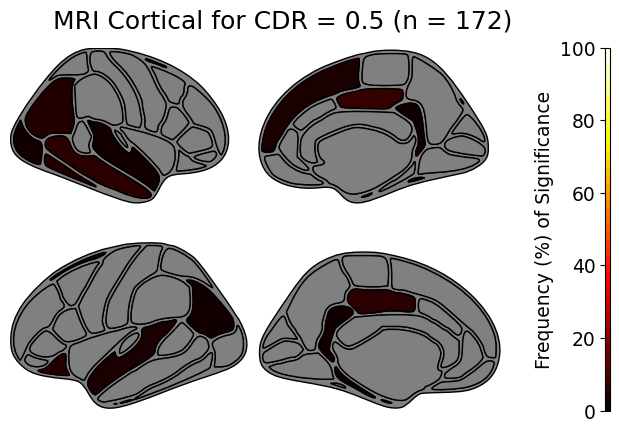

...

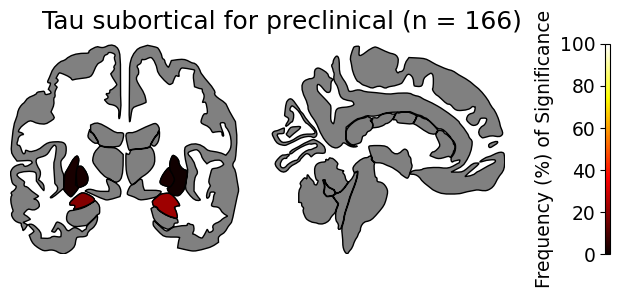

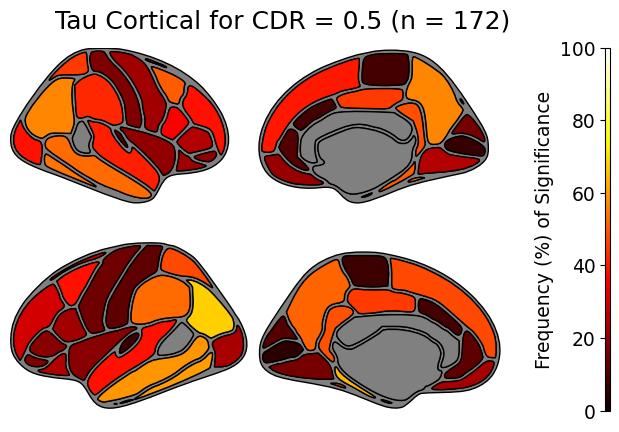

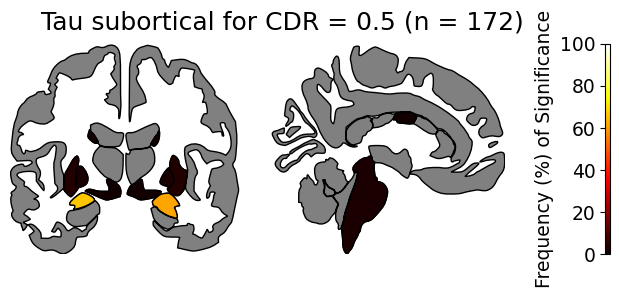

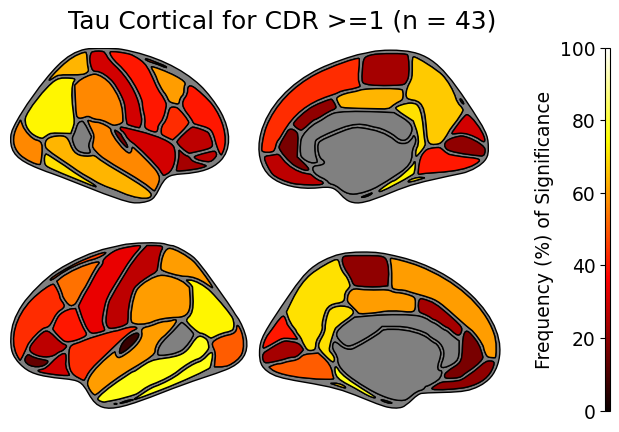

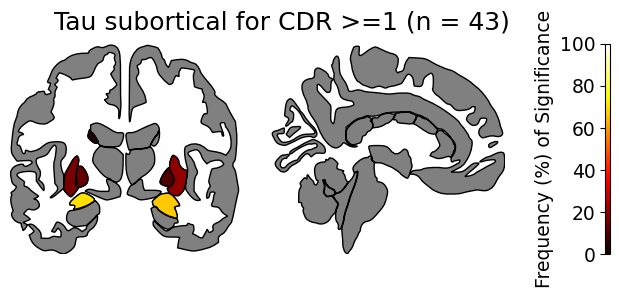

In [14]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

other_cols = [col for col in temp_dev_mmvae.columns if '_Nvol' not in col and '_Asuvr' not in col and '_Tsuvr' not in col]
reject_corr[other_cols] = temp_dev_mmvae[other_cols]

reject_corr_ADNI = reject_corr.loc[reject_corr.dataset == 'ADNI'].reset_index(drop = True)
mri_roi_sig_hc_ADNI, mri_roi_sig_precl_ADNI, mri_roi_sig_cdr05_ADNI, mri_roi_sig_cdr1_ADNI, amyloid_roi_sig_hc_ADNI, amyloid_roi_sig_precl_ADNI, amyloid_roi_sig_cdr05_ADNI, amyloid_roi_sig_cdr1_ADNI, tau_roi_sig_hc_ADNI, tau_roi_sig_precl_ADNI, tau_roi_sig_cdr05_ADNI, tau_roi_sig_cdr1_ADNI = freq_of_sig_disease_cat(reject_corr_ADNI, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols)


In [15]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

# reject_corr_KARI = reject_corr.loc[reject_corr.dataset == 'KARI'].reset_index(drop = True)
# mri_roi_sig_hc_KARI, mri_roi_sig_precl_KARI, mri_roi_sig_cdr05_KARI, mri_roi_sig_cdr1_KARI, amyloid_roi_sig_hc_KARI, amyloid_roi_sig_precl_KARI, amyloid_roi_sig_cdr05_KARI, amyloid_roi_sig_cdr1_KARI, tau_roi_sig_hc_KARI, tau_roi_sig_precl_KARI, tau_roi_sig_cdr05_KARI, tau_roi_sig_cdr1_KARI = freq_of_sig_disease_cat(reject_corr_KARI, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols)


### Plotting absolute regional mean deviations (across disease categories)

In [16]:
#%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

#deviation_atlas_maps(temp_dev_mmvae, MRI_vol_cols, amyloid_SUVR_cols, tau_SUVR_cols)


## Effect size maps of regional mean deviations (thresholded by FDR-corrected p values)

In [17]:
def cohen_d(group1, group2):
    
    mean1 = np.mean(group1)
    mean2 = np.mean(group2)
    std1 = np.std(group1, ddof=1)
    std2 = np.std(group2, ddof=1)
    n1 = len(group1)
    n2 = len(group2)

    pooled_std = np.sqrt(((n1 - 1) * std1**2 + (n2 - 1) * std2**2) / (n1 + n2 - 2))
    cohens_d = (mean1 - mean2) / pooled_std
    
    return cohens_d


def calculate_effect_size(temp_dev_mmvae, MRI_vol_cols):
    
    dev_hc = (temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'HC'][MRI_vol_cols])
    dev_precl = (temp_dev_mmvae.loc[temp_dev_mmvae.stage == 'preclinical'][MRI_vol_cols])
    dev_cdr05 = (temp_dev_mmvae.loc[(temp_dev_mmvae.stage == 'cdr = 0.5')][MRI_vol_cols])
    dev_cdr1 = (temp_dev_mmvae.loc[(temp_dev_mmvae.stage == 'cdr >= 1')][MRI_vol_cols])

    p_list_hc_precl = []
    p_list_hc_cdr05 = []
    p_list_hc_cdr1 = []

    cohen_list_hc_precl = []
    cohen_list_hc_cdr05 = []
    cohen_list_hc_cdr1 = []

    for mri_col in MRI_vol_cols:
        F, p = f_oneway(dev_hc[mri_col], dev_precl[mri_col])
        p_list_hc_precl.append(p)
        cohen_list_hc_precl.append(cohen_d(dev_hc[mri_col], dev_precl[mri_col]))

    for mri_col in MRI_vol_cols:
        F, p = f_oneway(dev_hc[mri_col], dev_cdr05[mri_col])
        p_list_hc_cdr05.append(p)
        cohen_list_hc_cdr05.append(cohen_d(dev_hc[mri_col], dev_cdr05[mri_col]))

    for mri_col in MRI_vol_cols:
        F, p = f_oneway(dev_hc[mri_col], dev_cdr1[mri_col])
        p_list_hc_cdr1.append(p)
        cohen_list_hc_cdr1.append(cohen_d(dev_hc[mri_col], dev_cdr1[mri_col]))

    fdr_p_list_hc_precl = fdrcorrection(p_list_hc_precl, method='indep')[1]
    fdr_p_list_hc_cdr05 = fdrcorrection(p_list_hc_cdr05, method='indep')[1]
    fdr_p_list_hc_cdr1 = fdrcorrection(p_list_hc_cdr1, method='indep')[1]

    sig_cohen_hc_precl = cohen_list_hc_precl.copy()
    for i in range(len(cohen_list_hc_precl)):
        if fdr_p_list_hc_precl[i] < 0.05:
            sig_cohen_hc_precl[i] = cohen_list_hc_precl[i]
        else:
            sig_cohen_hc_precl[i] = 0


    sig_cohen_hc_cdr05 = cohen_list_hc_cdr05.copy()
    for i in range(len(cohen_list_hc_cdr05)):
        if fdr_p_list_hc_cdr05[i] < 0.05:
            sig_cohen_hc_cdr05[i] = cohen_list_hc_cdr05[i]
        else:
            sig_cohen_hc_cdr05[i] = 0


    sig_cohen_hc_cdr1 = cohen_list_hc_cdr1.copy()
    for i in range(len(cohen_list_hc_cdr1)):
        if fdr_p_list_hc_cdr1[i] < 0.05:
            sig_cohen_hc_cdr1[i] = cohen_list_hc_cdr1[i]
        else:
            sig_cohen_hc_cdr1[i] = 0
            
    return sig_cohen_hc_precl, sig_cohen_hc_cdr05, sig_cohen_hc_cdr1
    

In [18]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'

from scipy.stats import f_oneway

def plot_effect_size(temp_dev_mmvae, modality_cols, modality, strip_suffix_col, dataset, value_range):
    
    from scipy.stats import f_oneway

    temp_dev_mmvae = temp_dev_mmvae.loc[temp_dev_mmvae.dataset == dataset].reset_index(drop = True)

    sig_cohen_hc_precl, sig_cohen_hc_cdr05, sig_cohen_hc_cdr1 = calculate_effect_size(temp_dev_mmvae, modality_cols)

    sig_cohen_hc_precl = [abs(x) for x in sig_cohen_hc_precl]
    sig_cohen_hc_cdr05 = [abs(x) for x in sig_cohen_hc_cdr05]
    sig_cohen_hc_cdr1 = [abs(x) for x in sig_cohen_hc_cdr1]
    
    ggseg_cols = [element.rstrip(strip_suffix_col) for element in modality_cols]
    
    effect_hc_precl = {key: value for key, value in dict(zip(ggseg_cols, sig_cohen_hc_precl)).items() if value != 0}
    effect_hc_cdr05 = {key: value for key, value in dict(zip(ggseg_cols, sig_cohen_hc_cdr05)).items() if value != 0}
    effect_hc_cdr1 = {key: value for key, value in dict(zip(ggseg_cols, sig_cohen_hc_cdr1)).items() if value != 0}
    
    def plot_maps(effect_list, sig_cohen_list, modality, fig_title, value_range):
        
        ggseg_python.plot_dk(effect_list, cmap='hot',
                          background='w', edgecolor='k', bordercolor='gray', figsize = (6,4), fontsize = 18, vminmax = value_range, 
                          ylabel='Effect size', title=fig_title)
        print('Max = {}, Min = {}'.format(max(sig_cohen_list), min(sig_cohen_list)))


        ggseg_python.plot_aseg(effect_list, cmap='hot',
                          background='w', edgecolor='k', bordercolor='gray', figsize = (6,4), fontsize = 18, vminmax = value_range, 
                          ylabel='Effect size', title=fig_title)
        print('Max = {}, Min = {}'.format(max(sig_cohen_list), min(sig_cohen_list)))

    
    #plot_maps(effect_hc_precl, sig_cohen_hc_precl, modality, 'HC vs precl ({} {} deviations)'.format(dataset, modality), value_range)
    #plot_maps(effect_hc_cdr05, sig_cohen_hc_cdr05, modality, 'HC vs cdr=0.5 ({} {} deviations)'.format(dataset, modality), value_range)
    #plot_maps(effect_hc_cdr1, sig_cohen_hc_cdr1, modality, 'HC vs cdr>=1 ({} {} deviations)'.format(dataset, modality), value_range)
    
    return sig_cohen_hc_precl, sig_cohen_hc_cdr05, sig_cohen_hc_cdr1, effect_hc_precl, effect_hc_cdr05, effect_hc_cdr1 



In [19]:
#--------------------ADNI ------------------------
# plot_effect_size(temp_dev_mmvae, MRI_vol_cols, 'MRI', '_Nvol', 'ADNI', [0, 3.5])
# plot_effect_size(temp_dev_mmvae, amyloid_SUVR_cols, 'Amyloid', '_Asuvr', 'ADNI', [0, 3.5])
# plot_effect_size(temp_dev_mmvae, tau_SUVR_cols, 'Tau', '_Tsuvr', 'ADNI', [0, 3.5])



In [20]:
#--------------------KARI ------------------------
# plot_effect_size(temp_dev_mmvae, MRI_vol_cols, 'MRI', '_Nvol', 'KARI', [0, 3.5])
# plot_effect_size(temp_dev_mmvae, amyloid_SUVR_cols, 'Amyloid', '_Asuvr', 'KARI', [0, 3.5])
# plot_effect_size(temp_dev_mmvae, tau_SUVR_cols, 'Tau', '_Tsuvr', 'KARI', [0, 3.5])


## Dissimilarity between patients (Hamming distance)

In [21]:
def calculate_hamming(reject_corr, modality_cols, dataset):
    
    reject_corr_temp = reject_corr.loc[reject_corr.dataset == dataset].reset_index(drop = True)
    reject_corr_temp[modality_cols] = reject_corr_temp[modality_cols].fillna(0)
    
    reject_corr_hc = reject_corr_temp.loc[reject_corr_temp.stage == 'HC'].reset_index(drop = True)
    reject_corr_precl = reject_corr_temp.loc[reject_corr_temp.stage == 'preclinical'].reset_index(drop = True)
    reject_corr_cdr05 = reject_corr_temp.loc[reject_corr_temp.stage == 'cdr = 0.5'].reset_index(drop = True)
    reject_corr_cdr1 = reject_corr_temp.loc[reject_corr_temp.stage == 'cdr >= 1'].reset_index(drop = True)

    def hamming_distance(df):
        distances = np.zeros((df.shape[0], df.shape[0]))
        for i in range(df.shape[0]):
            for j in range(df.shape[0]):
                distances[i, j] = sum(df.iloc[i] != df.iloc[j])
        return distances

    dist_hc = hamming_distance(reject_corr_hc[modality_cols])
    dist_precl = hamming_distance(reject_corr_precl[modality_cols])
    dist_cdr05 = hamming_distance(reject_corr_cdr05[modality_cols])
    dist_cdr1 = hamming_distance(reject_corr_cdr1[modality_cols])
    
    return dist_hc, dist_precl, dist_cdr05, dist_cdr1


def calculate_stats(array):
    
    from scipy import stats
    median = np.median(array)
    
    q75, q25 = np.percentile(array, [75 ,25])
    iqr = q75 - q25

    ci = stats.t.interval(0.95, len(array)-1, loc=np.mean(array), scale=stats.sem(array))
    
    print('Median = {}, IQR = {}, 95% CI = {}'.format(median, iqr, ci))
    #return median, iqr, ci


# def compare_group_means(*groups):
#     f_value, p_value = f_oneway(*groups)
#     return f_value, p_value

# f_value, p_value = compare_group_means(dist_hc[:,0], dist_precl[:,0], dist_cdr05[:,0], dist_cdr1[:,0])

# print("F-value:", f_value)
# print("P-value:", p_value)

#############################################
#############################################

dist_hc_adni, dist_precl_adni, dist_cdr05_adni, dist_cdr1_adni = calculate_hamming(reject_corr, fs_cols, 'ADNI')
dist_hc_kari, dist_precl_kari, dist_cdr05_kari, dist_cdr1_kari = calculate_hamming(reject_corr, fs_cols, 'KARI')

calculate_stats(np.median(dist_hc_adni, axis = 1))
calculate_stats(np.median(dist_precl_adni, axis = 1))
calculate_stats(np.median(dist_cdr05_adni, axis = 1))
calculate_stats(np.median(dist_cdr1_adni, axis = 1))

print('\n')

calculate_stats(np.median(dist_hc_kari, axis = 1))
calculate_stats(np.median(dist_precl_kari, axis = 1))
calculate_stats(np.median(dist_cdr05_kari, axis = 1))
calculate_stats(np.median(dist_cdr1_kari, axis = 1))

Median = 2.75, IQR = 2.75, 95% CI = (2.2835695209698335, 10.625521388121076)
Median = 46.0, IQR = 10.5, 95% CI = (46.1972980904248, 50.28755039442368)
Median = 55.25, IQR = 14.0, 95% CI = (54.87210079084656, 59.42789920915344)
Median = 59.5, IQR = 12.125, 95% CI = (57.178049287390486, 65.35528404594284)


Median = 2.0, IQR = 3.0, 95% CI = (1.5556524295274636, 8.250799183375761)
Median = 9.0, IQR = 10.5, 95% CI = (12.563844059424309, 20.71973803012793)
Median = 18.5, IQR = 17.75, 95% CI = (19.388329928788302, 34.195003404545034)
Median = 21.0, IQR = 22.5, 95% CI = (17.421949142788037, 47.435193714354824)


In [22]:
from scipy.stats import ttest_ind, mannwhitneyu, f_oneway, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# med_hc_adni = np.median(dist_hc_adni, axis = 1)
# med_precl_adni = np.median(dist_precl_adni, axis = 1)
# med_cdr05_adni = np.median(dist_cdr05_adni, axis = 1)
# med_cdr1_adni = np.median(dist_cdr1_adni, axis = 1)

# med_adni_data = np.concatenate([med_hc_adni, med_precl_adni, med_cdr05_adni, med_cdr1_adni])
# groups = ['hc']*len(med_hc_adni) + ['precl']*len(med_precl_adni) + ['cdr0.5']*len(med_cdr05_adni) + ['cdr1']*len(med_cdr1_adni)

# df = pd.DataFrame({'value': med_adni_data, 'group': groups})


# med_hc_kari = np.median(dist_hc_kari, axis = 1)
# med_precl_kari = np.median(dist_precl_kari, axis = 1)
# med_cdr05_kari = np.median(dist_cdr05_kari, axis = 1)
# med_cdr1_kari = np.median(dist_cdr1_kari, axis = 1)

def hamming_stats(dataset, dist_hc_adni, dist_precl_adni, dist_cdr05_adni, dist_cdr1_adni):
    
    med_hc_adni = np.median(dist_hc_adni, axis = 1)
    med_precl_adni = np.median(dist_precl_adni, axis = 1)
    med_cdr05_adni = np.median(dist_cdr05_adni, axis = 1)
    med_cdr1_adni = np.median(dist_cdr1_adni, axis = 1)

    med_adni_data = np.concatenate([med_hc_adni, med_precl_adni, med_cdr05_adni, med_cdr1_adni])
    groups = ['hc']*len(med_hc_adni) + ['precl']*len(med_precl_adni) + ['cdr0.5']*len(med_cdr05_adni) + ['cdr1']*len(med_cdr1_adni)

    df = pd.DataFrame({'value': med_adni_data, 'group': groups})
    
    anova_result = f_oneway(med_hc_adni, med_precl_adni, med_cdr05_adni, med_cdr1_adni)
    print("ANOVA result:", anova_result)
    
    tukey_result = pairwise_tukeyhsd(df['value'], df['group'], alpha=0.05)
    print(tukey_result)

    
#     print('{} multiple comparisons\n'.format(dataset))
#     print(f_oneway(med_hc_adni, med_precl_adni, med_cdr05_adni, med_cdr1_adni))
#     print(kruskal(med_hc_adni, med_precl_adni, med_cdr05_adni, med_cdr1_adni))
#     print('\n')
#     print('{} pairwise comparisons\n'.format(dataset))

    print('CU vs precl')
    print(mannwhitneyu(med_hc_adni, med_precl_adni))
    print('precl vs CDR = 0.5')
    print(mannwhitneyu(med_precl_adni, med_cdr05_adni))
    print('CDR = 0.5 vs CDR >=1')
    print(mannwhitneyu(med_cdr05_adni, med_cdr1_adni))
    print('\n')

    print(ttest_ind(med_hc_adni, med_precl_adni))
    print(ttest_ind(med_precl_adni, med_cdr05_adni))
    print(ttest_ind(med_cdr05_adni, med_cdr1_adni))

#hamming_stats('ADNI', dist_hc_adni, dist_precl_adni, dist_cdr05_adni, dist_cdr1_adni)
hamming_stats('KARI', dist_hc_kari, dist_precl_kari, dist_cdr05_kari, dist_cdr1_kari)

ANOVA result: F_onewayResult(statistic=11.949765482081412, pvalue=6.22539785393154e-07)
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
cdr0.5   cdr1   5.6369  0.807 -11.5756  22.8494  False
cdr0.5     hc -21.8884  0.001 -32.7831 -10.9938   True
cdr0.5  precl -10.1499 0.0321 -19.6821  -0.6176   True
  cdr1     hc -27.5253  0.001 -44.2933 -10.7574   True
  cdr1  precl -15.7868 0.0528 -31.7033   0.1297  False
    hc  precl  11.7386 0.0034   3.0347  20.4425   True
------------------------------------------------------
CU vs precl
MannwhitneyuResult(statistic=217.0, pvalue=1.4962097135264782e-10)
precl vs CDR = 0.5
MannwhitneyuResult(statistic=343.0, pvalue=1.592436434264682e-05)
CDR = 0.5 vs CDR >=1
MannwhitneyuResult(statistic=47.0, pvalue=0.042139688420647074)


Ttest_indResult(statistic=-3.6585089963533313, pvalue=0.0004144707903286517)
Ttest_indResult(statistic=-2.51976

In [ ]:
def plot_dissimilarity(reject_corr, modality_cols, modality, dataset, hamming_type, only_density = True):
    
    save_path = '/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Plots/Hamming'
    
    reject_corr_temp = reject_corr.loc[reject_corr.dataset == dataset].reset_index(drop = True)
    reject_corr_temp[modality_cols] = reject_corr_temp[modality_cols].fillna(0)
    
    reject_corr_hc = reject_corr_temp.loc[reject_corr_temp.stage == 'HC'].reset_index(drop = True)
    reject_corr_precl = reject_corr_temp.loc[reject_corr_temp.stage == 'preclinical'].reset_index(drop = True)
    reject_corr_cdr05 = reject_corr_temp.loc[reject_corr_temp.stage == 'cdr = 0.5'].reset_index(drop = True)
    reject_corr_cdr1 = reject_corr_temp.loc[reject_corr_temp.stage == 'cdr >= 1'].reset_index(drop = True)

    def hamming_distance(df):
        distances = np.zeros((df.shape[0], df.shape[0]))
        for i in range(df.shape[0]):
            for j in range(df.shape[0]):
                distances[i, j] = sum(df.iloc[i] != df.iloc[j])
        return distances

    dist_hc = hamming_distance(reject_corr_hc[modality_cols])
    dist_precl = hamming_distance(reject_corr_precl[modality_cols])
    dist_cdr05 = hamming_distance(reject_corr_cdr05[modality_cols])
    dist_cdr1 = hamming_distance(reject_corr_cdr1[modality_cols])
    
    #max_val = max(dist_hc.flatten() + dist_precl.flatten() + dist_cdr05.flatten() + dist_cdr1.flatten())

    #--------------------------------
    
    if only_density == False:
        
        plt.subplots(figsize = (24, 6))

        max_val = 150

        plt.subplot(1,4,1)
        heatmap = sns.heatmap(dist_hc, xticklabels=False, yticklabels=False, annot=False, vmin = 0, vmax = max_val)
        cbar = heatmap.collections[0].colorbar
        cbar.set_label('Color Bar Label', fontsize=12) 
        
        #plt.title('{} {} cogntively unimpaired (n = {})'.format(dataset, modality, len(dist_hc)), fontsize = 20)

        plt.subplot(1,4,2)
        sns.heatmap(dist_precl, xticklabels=False, yticklabels=False, annot=False, vmin = 0, vmax = max_val)
        #plt.title('{} {} preclinical (n = {})'.format(dataset, modality, len(dist_precl)), fontsize = 20)

        plt.subplot(1,4,3)
        sns.heatmap(dist_cdr05, xticklabels=False, yticklabels=False, annot=False, vmin = 0, vmax = max_val)
        #plt.title('{} {} CDR = 0.5 (n = {})'.format(dataset, modality, len(dist_cdr05)), fontsize = 20)

        plt.subplot(1,4,4)
        sns.heatmap(dist_cdr1, xticklabels=False, yticklabels=False, annot=False, vmin = 0, vmax = max_val)
        #plt.title('{} {} CDR >= 1 (n = {})'.format(dataset, modality, len(dist_cdr1)), fontsize = 20)

        plt.tight_layout()
        #plt.suptitle('Hamming distance heatmaps')
        plt.subplots_adjust(top = 0.9, hspace= 0.2, wspace = 0.05)
        
        #plt.savefig(os.path.join(save_path, 'hamm_'+ modality + '_' + dataset + '.pdf'), bbox_inches = 'tight', dpi = 600)


    #----------------------------------

    #plt.figure(figsize = (7,5))
    sns.kdeplot(dist_hc.flatten(), fill = True, label = 'amyloid negative CU')
    sns.kdeplot(dist_precl.flatten(), fill = True, label = 'CDR = 0 ADS')
    sns.kdeplot(dist_cdr05.flatten(), fill = True, label = 'CDR = 0.5 ADS')
    sns.kdeplot(dist_cdr1.flatten(), fill = True, label = 'CDR >= 1 ADS')
    
    plt.xlabel('Dissimilarity ({})'.format(hamming_type), fontsize = 16)
    plt.ylabel('Density', fontsize = 16)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.legend(fontsize = 14)
    #plt.xlim(-10, 80)
    
    if dataset == 'ADNI':
        plt.title('ADNI', fontsize = 20)
    
    if dataset == 'KARI':
        plt.title('ADRC', fontsize = 20)
    
    #plt.savefig(os.path.join(save_path, 'hamm_kde_'+ modality + '_' + dataset + '.pdf'), bbox_inches = 'tight', dpi = 600)

    
    #return dist_hc, dist_precl, dist_cdr05, dist_cdr1


# plt.subplots(figsize = (18,6))

# plt.subplot(1,2,1)
# plot_dissimilarity(reject_corr, fs_cols, 'all_modalities', 'ADNI', 'hamming_all', only_density = True)

# plt.subplot(1,2,2)
# plot_dissimilarity(reject_corr, fs_cols, 'all_modalities', 'KARI', 'hamming_all', only_density = True)

# plt.tight_layout()
# plt.subplots_adjust(top = 0.9, hspace= 0.3, wspace = 0.3)
# plt.savefig('/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Manuscript_sections/Plots/for_paper/hamming_allmod.pdf', bbox_inches = 'tight', dpi = 600)

#***********************

plt.subplots(figsize = (12,16))

plt.subplot(3,2,1)
plot_dissimilarity(reject_corr, MRI_vol_cols, 'MRI', 'ADNI', 'hamming_mri', only_density = True)

plt.subplot(3,2,2)
plot_dissimilarity(reject_corr, MRI_vol_cols, 'MRI', 'KARI', 'hamming_mri', only_density = True)

plt.subplot(3,2,3)
plot_dissimilarity(reject_corr, amyloid_SUVR_cols, 'Amyloid', 'ADNI', 'hamming_amyloid', only_density = True)

plt.subplot(3,2,4)
plot_dissimilarity(reject_corr, amyloid_SUVR_cols, 'Amyloid', 'KARI', 'hamming_amyloid', only_density = True)

plt.subplot(3,2,5)
plot_dissimilarity(reject_corr, tau_SUVR_cols, 'Tau', 'ADNI', 'hamming_tau', only_density = True)

plt.subplot(3,2,6)
plot_dissimilarity(reject_corr, tau_SUVR_cols, 'Tau', 'KARI', 'hamming_tau', only_density = True)

plt.tight_layout()
plt.subplots_adjust(top = 0.9, hspace= 0.35, wspace = 0.35)

plt.savefig('/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Manuscript_sections/revised_version_SK/truncated_versions/Figures_tables/hamming_mod_specific.pdf', bbox_inches = 'tight', dpi = 600)


## Corrlation with cognition

### Association between cognition and mean deviations. Regression lines stratified by disease categories

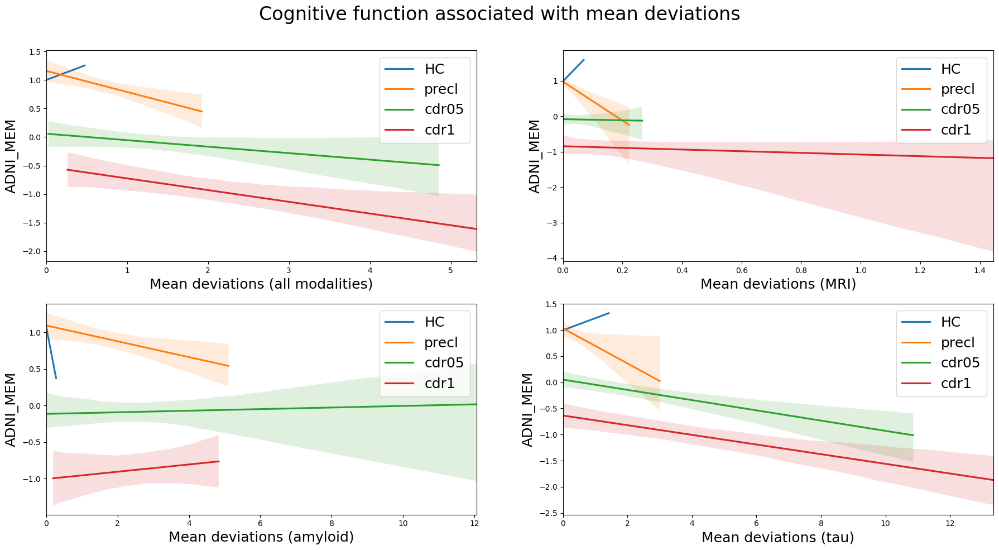

In [24]:
reject_corr['mri_toc_fdr'] = reject_corr[MRI_vol_cols].apply(lambda x: (x == 1).sum(), axis=1)/90*100
reject_corr['amyloid_toc_fdr'] = reject_corr[amyloid_SUVR_cols].apply(lambda x: (x == 1).sum(), axis=1)/90*100
reject_corr['tau_toc_fdr'] = reject_corr[tau_SUVR_cols].apply(lambda x: (x == 1).sum(), axis=1)/90*100
#reject_corr['all_toc_fdr'] = (reject_corr['mri_toc_fdr'] + reject_corr['mri_toc_fdr'] + reject_corr['mri_toc_fdr'])/3
reject_corr['all_toc_fdr'] = (reject_corr[fs_cols].sum(axis = 1))/270*100

comp_cog_adni = pd.read_csv('/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/UWNPSYCHSUM_01_23_23_13May2023.csv')
cog_adni_comp = pd.merge(comp_cog_adni, all_atn_adni[['RID', 'mri_date', 'amyloid_date', 'tau_date']], on = 'RID', how = 'right').sort_values(by = ['RID', 'EXAMDATE']).reset_index(drop = True)
cog_adni_comp['date_diff'] = abs(pd.to_datetime(cog_adni_comp['mri_date']) - pd.to_datetime(cog_adni_comp['EXAMDATE'])).dt.days

cog_adni_comp = cog_adni_comp.sort_values(by = ['RID', 'date_diff']).drop_duplicates(subset = 'RID', keep = 'first')
#cog_adni_test_comp = cog_adni_comp.loc[cog_adni_comp.RID.isin(reject_corr.ID.values)].reset_index(drop = True)
#cog_adni_test_comp = cog_adni_comp.merge(reject_corr[['ID', 'stage', 'mri_toc_fdr', 'amyloid_toc_fdr', 'tau_toc_fdr', 'all_toc_fdr', 'mri_toc', 'amyloid_toc', 'tau_toc', 'all_toc']], left_on = 'RID', right_on = 'ID', how = 'inner').reset_index(drop = True)

cog_adni_test_comp = cog_adni_comp.merge(temp_dev_mmvae[['ID', 'stage', 'mean_dev_mri_sig_fdr', 'mean_dev_amyloid_sig_fdr', 'mean_dev_tau_sig_fdr', 'mean_dev_all_sig_fdr']], left_on = 'RID', right_on = 'ID', how = 'inner').reset_index(drop = True)


cog_adni_test_comp['ADNI_MEM'] = cog_adni_test_comp['ADNI_MEM'].fillna(cog_adni_test_comp['ADNI_MEM'].mean())
cog_adni_test_comp['ADNI_EF'] = cog_adni_test_comp['ADNI_EF'].fillna(cog_adni_test_comp['ADNI_EF'].mean())
cog_adni_test_comp['ADNI_LAN'] = cog_adni_test_comp['ADNI_LAN'].fillna(cog_adni_test_comp['ADNI_LAN'].mean())
cog_adni_test_comp['ADNI_VS'] = cog_adni_test_comp['ADNI_VS'].fillna(cog_adni_test_comp['ADNI_VS'].mean())

cog_adni_test_comp_hc = cog_adni_test_comp.loc[cog_adni_test_comp.stage == 'HC'].reset_index(drop = True)
cog_adni_test_comp_precl = cog_adni_test_comp.loc[cog_adni_test_comp.stage == 'preclinical'].reset_index(drop = True)
cog_adni_test_comp_cdr05 = cog_adni_test_comp.loc[cog_adni_test_comp.stage == 'cdr = 0.5'].reset_index(drop = True)
cog_adni_test_comp_cdr1 = cog_adni_test_comp.loc[cog_adni_test_comp.stage == 'cdr >= 1'].reset_index(drop = True)

cog_cols = ['ADNI_MEM', 'ADNI_EF', 'ADNI_LAN', 'ADNI_VS']
#plt.plot(cog_adni_test_comp_hc['all_toc'], m_hc*cog_adni_test_comp_hc['ADNI_MEM'] + b_hc, color = 'red')

#------------ All modalities ------------------------
plt.subplots(figsize = (18, 10))

plt.subplot(2,2,1)
sns.regplot(x = 'mean_dev_all_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_hc, scatter = False, ci = 0, label = 'HC')
sns.regplot(x = 'mean_dev_all_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_precl, scatter = False, ci = 95, label = 'precl')
sns.regplot(x = 'mean_dev_all_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr05, scatter = False, ci = 95, label = 'cdr05')
sns.regplot(x = 'mean_dev_all_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr1, scatter = False, ci = 95, label = 'cdr1')
plt.xlabel('Mean deviations (all modalities)', fontsize = 18)
plt.ylabel('ADNI_MEM', fontsize = 18)
plt.legend(fontsize = 18)

plt.subplot(2,2,2)
sns.regplot(x = 'mean_dev_mri_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_hc, scatter = False, ci = 0, label = 'HC')
sns.regplot(x = 'mean_dev_mri_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_precl, scatter = False, ci = 95, label = 'precl')
sns.regplot(x = 'mean_dev_mri_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr05, scatter = False, ci = 95, label = 'cdr05')
sns.regplot(x = 'mean_dev_mri_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr1, scatter = False, ci = 95, label = 'cdr1')
plt.xlabel('Mean deviations (MRI)', fontsize = 18)
plt.ylabel('ADNI_MEM', fontsize = 18)
plt.legend(fontsize = 18)

plt.subplot(2,2,3)
sns.regplot(x = 'mean_dev_amyloid_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_hc, scatter = False, ci = 0, label = 'HC')
sns.regplot(x = 'mean_dev_amyloid_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_precl, scatter = False, ci = 95, label = 'precl')
sns.regplot(x = 'mean_dev_amyloid_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr05, scatter = False, ci = 95, label = 'cdr05')
sns.regplot(x = 'mean_dev_amyloid_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr1, scatter = False, ci = 95, label = 'cdr1')
plt.xlabel('Mean deviations (amyloid)', fontsize = 18)
plt.ylabel('ADNI_MEM', fontsize = 18)
plt.legend(fontsize = 18)

plt.subplot(2,2,4)
sns.regplot(x = 'mean_dev_tau_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_hc, scatter = False, ci = 0, label = 'HC')
sns.regplot(x = 'mean_dev_tau_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_precl, scatter = False, ci = 95, label = 'precl')
sns.regplot(x = 'mean_dev_tau_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr05, scatter = False, ci = 95, label = 'cdr05')
sns.regplot(x = 'mean_dev_tau_sig_fdr', y= 'ADNI_MEM', data = cog_adni_test_comp_cdr1, scatter = False, ci = 95, label = 'cdr1')
plt.xlabel('Mean deviations (tau)', fontsize = 18)
plt.ylabel('ADNI_MEM', fontsize = 18)
plt.legend(fontsize = 18)
plt.tight_layout()
plt.suptitle('Cognitive function associated with mean deviations', fontsize = 24)
plt.subplots_adjust(top = 0.9, hspace= 0.2, wspace = 0.2)
    

## Correlation of patient-level deviations over outlier regions (FDR corrected) with cognition (ADNI)

Text(0, 0.5, 'DSI')

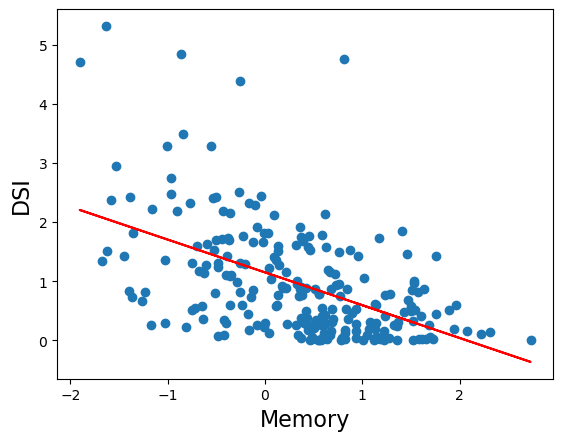

In [37]:
cog = 'ADNI_MEM'
m, b = np.polyfit(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_all_sig_fdr'], 1)
plt.plot(dev_bvae_adni_cog[cog], m*dev_bvae_adni_cog[cog] + b, color = 'red')

plt.scatter(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_all_sig_fdr'])
plt.xlabel('Memory', fontsize = 16)
plt.ylabel('DSI', fontsize = 16)


Text(0.5, 0.98, 'Pearson Correlation Coeffient between mean deviation and cognitive scores')

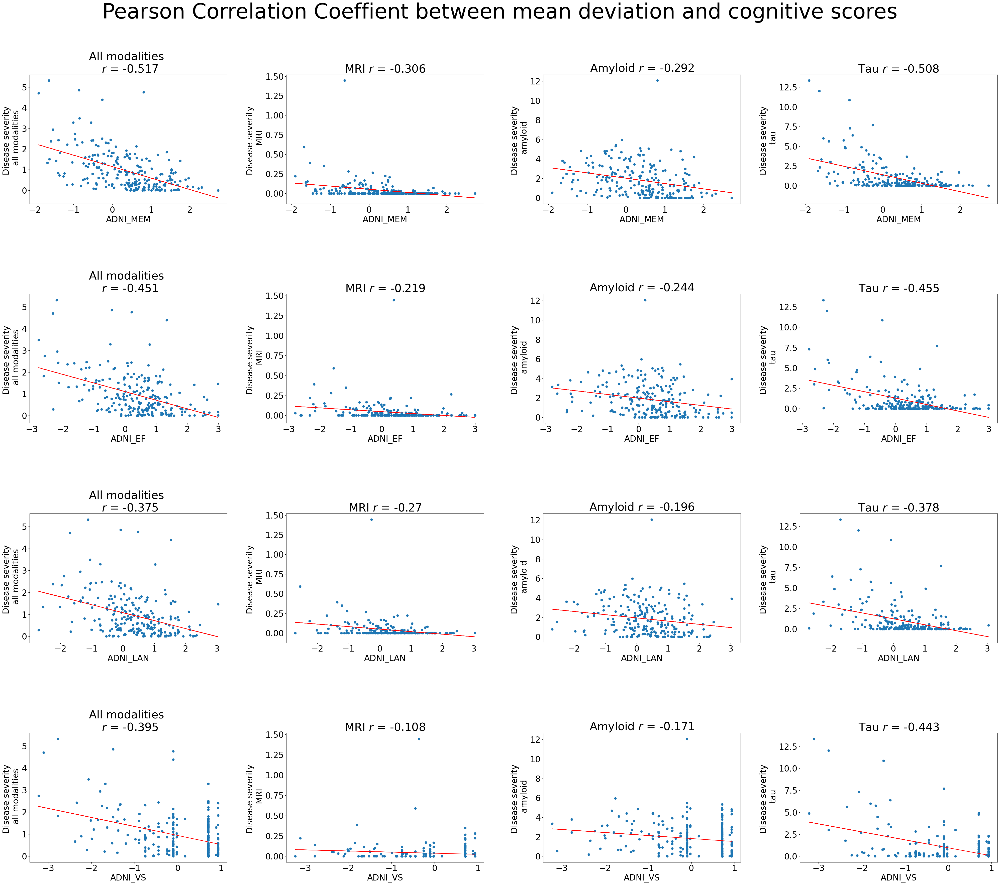

In [25]:
%run '/Users/sayantankumar/Desktop/Aris_Work/Codes/Normative Modeling/Journal_submission/helper_functions/mmVAE_functions.ipynb'


# Correlation of deviation maps with cog
#cog_adni_test = prepare_adni_cognition(tadpole_challenge_path, temp_dev_mmvae)

# dev_bvae_adni_cog = cog_correlation_adni(temp_dev_mmvae, cog_adni_test)

# temp_dev_mmvae['mean_dev_mri_true'] = abs(temp_dev_mmvae[MRI_vol_cols].apply(lambda row: row[lambda x: x < 0].mean(), axis=1))
# temp_dev_mmvae['mean_dev_amyloid_true'] = temp_dev_mmvae[MRI_vol_cols].apply(lambda row: row[lambda x: x > 0].mean(), axis=1)
# temp_dev_mmvae['mean_dev_tau_true'] = temp_dev_mmvae[MRI_vol_cols].apply(lambda row: row[lambda x: x > 0].mean(), axis=1)

comp_cog_adni = pd.read_csv('/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/UWNPSYCHSUM_01_23_23_13May2023.csv')
cog_adni_comp = pd.merge(comp_cog_adni, all_atn_adni[['RID', 'mri_date', 'amyloid_date', 'tau_date']], on = 'RID', how = 'right').sort_values(by = ['RID', 'EXAMDATE']).reset_index(drop = True)
cog_adni_comp['date_diff'] = abs(pd.to_datetime(cog_adni_comp['mri_date']) - pd.to_datetime(cog_adni_comp['EXAMDATE'])).dt.days

cog_adni_comp = cog_adni_comp.sort_values(by = ['RID', 'date_diff']).drop_duplicates(subset = 'RID', keep = 'first')
cog_adni_test_comp = cog_adni_comp.loc[cog_adni_comp.RID.isin(temp_dev_mmvae.ID.values)].reset_index(drop = True)

cog_adni_test_comp['ADNI_MEM'] = cog_adni_test_comp['ADNI_MEM'].fillna(cog_adni_test_comp['ADNI_MEM'].mean())
cog_adni_test_comp['ADNI_EF'] = cog_adni_test_comp['ADNI_EF'].fillna(cog_adni_test_comp['ADNI_EF'].mean())
cog_adni_test_comp['ADNI_LAN'] = cog_adni_test_comp['ADNI_LAN'].fillna(cog_adni_test_comp['ADNI_LAN'].mean())
cog_adni_test_comp['ADNI_VS'] = cog_adni_test_comp['ADNI_VS'].fillna(cog_adni_test_comp['ADNI_VS'].mean())


from scipy.stats import pearsonr
from scipy.stats import spearmanr
    
dev_bvae_adni = reject_corr.loc[temp_dev_mmvae.dataset == 'ADNI'].reset_index(drop = True)
dev_bvae_adni_cog = pd.merge(dev_bvae_adni, cog_adni_test_comp[['RID', 'ADNI_MEM', 'ADNI_EF', 'ADNI_LAN', 'ADNI_VS']], left_on = 'ID', right_on = 'RID', how = 'inner')

cog_cols = ['ADNI_MEM', 'ADNI_EF', 'ADNI_LAN', 'ADNI_VS']


pearson_all_dev = []
pearson_mri_dev = []
pearson_amyloid_dev = []
pearson_tau_dev = []

pearson_all_toc = []
pearson_mri_toc = []
pearson_amyloid_toc = []
pearson_tau_toc = []

for cog in cog_cols:
    
    corr_p_all_dev, _ = pearsonr(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_all_sig_fdr'])
    corr_p_mri_dev, _ = pearsonr(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_mri_sig_fdr'])
    corr_p_amyloid_dev, _ = pearsonr(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_amyloid_sig_fdr'])
    corr_p_tau_dev, _ = pearsonr(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_tau_sig_fdr'])

    pearson_all_dev.append(corr_p_all_dev)
    pearson_mri_dev.append(corr_p_mri_dev)
    pearson_amyloid_dev.append(corr_p_amyloid_dev)
    pearson_tau_dev.append(corr_p_tau_dev)

    R2_pearson_all_dev = [i**2 for i in pearson_all_dev]
    R2_pearson_mri_dev = [i**2 for i in pearson_mri_dev]
    R2_pearson_amyloid_dev = [i**2 for i in pearson_amyloid_dev]
    R2_pearson_tau_dev = [i**2 for i in pearson_tau_dev]
    
fig, axs = plt.subplots(len(cog_cols), 4, figsize = (40, 36))
j = 0
for cog in cog_cols:

    #------------ All modalities ------------------------
    m, b = np.polyfit(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_all_sig_fdr'], 1)
    axs[j,0].plot(dev_bvae_adni_cog[cog], m*dev_bvae_adni_cog[cog] + b, color = 'red')

    axs[j,0].scatter(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_all_sig_fdr'])
    axs[j,0].tick_params(axis='x', labelsize=24)
    axs[j,0].tick_params(axis='y', labelsize=24)
    axs[j,0].set_xlabel(cog, fontsize = 24)
    axs[j,0].set_ylabel('Disease severity \n all modalities', fontsize = 24)
    axs[j,0].set_title('All modalities \n $r$ = {}'.format(round(pearson_all_dev[j], 3)), fontsize = 32)

    #------------ MRI ------------------------
    m, b = np.polyfit(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_mri_sig_fdr'], 1)
    axs[j,1].plot(dev_bvae_adni_cog[cog], m*dev_bvae_adni_cog[cog] + b, color = 'red')

    axs[j,1].scatter(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_mri_sig_fdr'])
    axs[j,1].set_xlabel(cog, fontsize = 24)
    axs[j,1].tick_params(axis='x', labelsize=24)
    axs[j,1].tick_params(axis='y', labelsize=24)
    axs[j,1].set_ylabel('Disease severity \n MRI', fontsize = 24)
    axs[j,1].set_title('MRI $r$ = {}'.format(round(pearson_mri_dev[j], 3)), fontsize = 32)

    #------------ Amyloid ------------------------
    m, b = np.polyfit(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_amyloid_sig_fdr'], 1)
    axs[j,2].plot(dev_bvae_adni_cog[cog], m*dev_bvae_adni_cog[cog] + b, color = 'red')

    axs[j,2].scatter(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_amyloid_sig_fdr'])
    axs[j,2].set_xlabel(cog, fontsize = 24)
    axs[j,2].tick_params(axis='x', labelsize=24)
    axs[j,2].tick_params(axis='y', labelsize=24)
    axs[j,2].set_ylabel('Disease severity \n amyloid', fontsize = 24)
    axs[j,2].set_title('Amyloid $r$ = {}'.format(round(pearson_amyloid_dev[j], 3)), fontsize = 32)

    #------------ Tau ------------------------
    m, b = np.polyfit(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_tau_sig_fdr'], 1)
    axs[j,3].plot(dev_bvae_adni_cog[cog], m*dev_bvae_adni_cog[cog] + b, color = 'red')

    axs[j,3].scatter(dev_bvae_adni_cog[cog], dev_bvae_adni_cog['mean_dev_tau_sig_fdr'])
    axs[j,3].set_xlabel(cog, fontsize = 24)
    axs[j,3].tick_params(axis='x', labelsize=24)
    axs[j,3].tick_params(axis='y', labelsize=24)
    axs[j,3].set_ylabel('Disease severity \n tau', fontsize = 24)
    axs[j,3].set_title('Tau $r$ = {}'.format(round(pearson_tau_dev[j], 3)), fontsize = 32)


    if cog == 'RAVLT_immediate':
        axs[j,0].set_xlabel('RAVLT', fontsize = 24)
        axs[j,1].set_xlabel('RAVLT', fontsize = 24)
        axs[j,2].set_xlabel('RAVLT', fontsize = 24)
        axs[j,3].set_xlabel('RAVLT', fontsize = 24)

    #fig.suptitle('Pearson Correlation Coeffient between mean deviation and cognitive scores', fontsize = 24)

    j = j + 1

fig.tight_layout()
fig.subplots_adjust(top = 0.9, hspace= 0.7, wspace = 0.3)
fig.suptitle('Pearson Correlation Coeffient between mean deviation and cognitive scores', fontsize = 60)



## CDR Progression based on severity quantiles

In [ ]:
import pandas as pd
from lifelines import CoxPHFitter
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt


##############################################################

cdr_adni = pd.read_csv('/Users/sayantankumar/Desktop/Aris_Work/Data/ADNI/CDR.csv')[['RID', 'USERDATE', 'CDGLOBAL']]
cdr_adni = cdr_adni.loc[cdr_adni.RID.isin(temp_dev_mmvae.ID.values)].reset_index(drop = True).rename(columns = {'RID':'ID', 'USERDATE':'TESTDATE', 'CDGLOBAL':'cdr'})

cdr_adni_test = pd.merge(cdr_adni, all_atn_adni[['RID', 'mri_date', 'amyloid_date', 'tau_date']], left_on = 'ID', right_on = 'RID', how = 'right').sort_values(by = ['ID', 'TESTDATE']).reset_index(drop = True)
cdr_adni_test['date_diff'] = (pd.to_datetime(cdr_adni_test['TESTDATE']) - pd.to_datetime(cdr_adni_test['mri_date'])).dt.days

cdr_adni_test = cdr_adni_test.sort_values(by = ['ID', 'date_diff']).drop_duplicates(subset = ['ID', 'TESTDATE'], keep = 'first')

cdr_adni_test = cdr_adni_test.loc[cdr_adni_test.date_diff > -60].reset_index(drop = True) 
cdr_adni_test['dataset'] = 'ADNI'
#-----------------------------------------

cdr_kari = pd.read_excel(os.path.join('/Users/sayantankumar/Desktop/Aris_Work/Data/module_freeze_june22/clinical_core/mod_b4_cdr.xlsx'))[['ID', 'TESTDATE', 'cdr']]
cdr_kari = cdr_kari.loc[cdr_kari.ID.isin(temp_dev_mmvae.ID.values)].reset_index(drop = True).rename(columns = {'RID':'ID', 'USERDATE':'TESTDATE', 'CDGLOBAL':'cdr'})

cdr_kari_test = pd.merge(cdr_kari, all_atn_kari[['ID', 'mri_date', 'amyloid_date', 'tau_date']], left_on = 'ID', right_on = 'ID', how = 'right').sort_values(by = ['ID', 'TESTDATE']).reset_index(drop = True)
cdr_kari_test['date_diff'] = (pd.to_datetime(cdr_kari_test['TESTDATE']) - pd.to_datetime(cdr_kari_test['mri_date'])).dt.days

cdr_kari_test = cdr_kari_test.sort_values(by = ['ID', 'date_diff']).drop_duplicates(subset = ['ID', 'TESTDATE'], keep = 'first')

cdr_kari_test = cdr_kari_test.loc[cdr_kari_test.date_diff > -60].reset_index(drop = True) 
cdr_kari_test['dataset'] = 'KARI'

cdr_both_test = pd.concat([cdr_adni_test, cdr_kari_test])[['ID', 'TESTDATE', 'cdr']].reset_index(drop = True)

#----------------------------------------

def calculate_progression_event(cdr_both_test, dataset):
    
    prog_cdr1 = cdr_both_test.copy()

    prog_cdr1['followup_interval'] = 0
    for i in range(len(prog_cdr1) - 1):
        if prog_cdr1.loc[i, 'ID'] == prog_cdr1.loc[i+1, 'ID']:
            prog_cdr1.loc[i+1, 'followup_interval'] = (pd.to_datetime(prog_cdr1.loc[i+1, 'TESTDATE']) - pd.to_datetime(prog_cdr1.loc[i, 'TESTDATE'])).days

    prog_cdr1['visit_type'] = 'followup'
    prog_cdr1.loc[0, 'visit_type'] = 'baseline'
    for i in range(len(prog_cdr1) - 1):
        if prog_cdr1.loc[i, 'ID'] != prog_cdr1.loc[i+1, 'ID']:
            prog_cdr1.loc[i+1, 'visit_type'] = 'baseline'

    excl_baseline_event = prog_cdr1.loc[(prog_cdr1.visit_type == 'baseline') & (prog_cdr1.cdr >= 1)].ID.values

    prog_cdr1 = prog_cdr1.loc[~prog_cdr1.ID.isin(excl_baseline_event)].reset_index(drop = True)

    prog_cdr1['event'] = 0
    for i in range(len(prog_cdr1) - 1):
        if (prog_cdr1.loc[i, 'visit_type'] == 'followup') & (prog_cdr1.loc[i, 'cdr'] >= 1):
            prog_cdr1.loc[i, 'event'] = 1

    prog_cdr1['time_to_event'] = prog_cdr1.groupby('ID')['followup_interval'].cumsum()
    
    prog_cdr1_cov = prog_cdr1.merge(temp_dev_mmvae[['ID','Age', 'Sex', 'stage', 'all_toc', 'mean_dev_all_sig_fdr']], on = 'ID', how = 'left')
    prog_cdr1_cov = prog_cdr1_cov.loc[prog_cdr1_cov.stage != 'HC'].reset_index(drop = True)

    prog_cdr1_cov['quantile_sev'] = pd.qcut(prog_cdr1_cov['mean_dev_all_sig_fdr'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'], duplicates = 'drop')
    prog_cdr1_cov['quantile_toc'] = pd.qcut(prog_cdr1_cov['all_toc'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'], duplicates = 'drop')

    prog_cdr1_cov['time_to_event'] = round(prog_cdr1_cov['time_to_event']/30)
    
    return prog_cdr1_cov



In [ ]:
def plot_survival_curve(prog_cdr1_cov, quantile_col, dataset):
    
    save_path = '/Users/sayantankumar/Desktop/Aris_Work/Submissions/Journal/Plots'
    
    #quantile_col = 'quantile_sev'
    prog_cdr1_cov_q1 = prog_cdr1_cov.loc[prog_cdr1_cov[quantile_col] == 'Q1']
    prog_cdr1_cov_q2 = prog_cdr1_cov.loc[prog_cdr1_cov[quantile_col] == 'Q2']
    prog_cdr1_cov_q3 = prog_cdr1_cov.loc[prog_cdr1_cov[quantile_col] == 'Q3']
    prog_cdr1_cov_q4 = prog_cdr1_cov.loc[prog_cdr1_cov[quantile_col] == 'Q4']

    #-------------------------------
    cph1 = CoxPHFitter()
    cph1.fit(prog_cdr1_cov_q1, duration_col='time_to_event', event_col='event', formula='Age + Sex')
    #print(cph1.summary)

    cph2 = CoxPHFitter()
    cph2.fit(prog_cdr1_cov_q2, duration_col='time_to_event', event_col='event', formula='Age + Sex')
    #print(cph2.summary)

    cph3 = CoxPHFitter()
    cph3.fit(prog_cdr1_cov_q3, duration_col='time_to_event', event_col='event', formula='Age + Sex')
    #print(cph3.summary)

    cph4 = CoxPHFitter()
    cph4.fit(prog_cdr1_cov_q4, duration_col='time_to_event', event_col='event', formula='Age + Sex')
    #print(cph4.summary)

    #--------------------------------

    kmf1 = KaplanMeierFitter()
    kmf1.fit(prog_cdr1_cov_q1['time_to_event'], event_observed=prog_cdr1_cov_q1['event'])

    kmf2 = KaplanMeierFitter()
    kmf2.fit(prog_cdr1_cov_q2['time_to_event'], event_observed=prog_cdr1_cov_q2['event'])

    kmf3 = KaplanMeierFitter()
    kmf3.fit(prog_cdr1_cov_q3['time_to_event'], event_observed=prog_cdr1_cov_q3['event'])

    kmf4 = KaplanMeierFitter()
    kmf4.fit(prog_cdr1_cov_q4['time_to_event'], event_observed=prog_cdr1_cov_q4['event'])

    #---------------------------------

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=(10, 5))

    # kmf1.survival_function_.plot(ax=ax, color='blue', linewidth = 2, label='quantile_1')
    # kmf2.survival_function_.plot(ax=ax, color='red', linewidth = 2, label='quantile_2')
    # kmf3.survival_function_.plot(ax=ax, color='green', linewidth = 2, label='quantile_3')
    # kmf4.survival_function_.plot(ax=ax, color='yellow', linewidth = 2, label='quantile_4')

    kmf1.plot(ax=ax, color='blue', linewidth = 2, label='q1')
    kmf2.plot(ax=ax, color='red', linewidth = 2, label='q2')
    kmf3.plot(ax=ax, color='green', linewidth = 2, label='q3')
    kmf4.plot(ax=ax, color='orange', linewidth = 2, label='q4')


    marker1, = ax.plot([], [], color='blue', label='q1')
    marker2, = ax.plot([], [], color='red', label='q2')
    marker3, = ax.plot([], [], color='green', label='q3')
    marker4, = ax.plot([], [], color='orange', label='q4')
    ax.legend(handles=[marker1, marker2, marker3, marker4], fontsize = 16)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.set_xlabel('Follow-up (months)', fontsize = 16)
    ax.set_ylabel('Progression probability', fontsize = 16)
    #ax.set_title("{} Progression to CDR >= 1 (disease severity)".format(dataset), fontsize = 18)

    plt.savefig(os.path.join(save_path, 'progression_' + dataset + '.pdf'), bbox_inches = 'tight', dpi = 600)


#prog_cdr1_cov_ADNI = calculate_progression_event(cdr_adni_test, 'ADNI')
prog_cdr1_cov_KARI = calculate_progression_event(cdr_kari_test, 'KARI')

#plot_survival_curve(prog_cdr1_cov_ADNI, 'quantile_sev', 'ADNI')
plot_survival_curve(prog_cdr1_cov_KARI, 'quantile_toc', 'KARI')

In [ ]:
all_atn_kari.to_csv('./saved_dataframes/all_atn_kari.csv')

In [ ]:
cog_adni = pd.read_csv(os.path.join(tadpole_challenge_path, 'ADNIMERGE.csv'))[['RID', 'EXAMDATE', 'VISCODE', 'DX_bl', 'MMSE', 'ADAS13', 'RAVLT_immediate', 'mPACCdigit', 'mPACCtrailsB']]
cog_adni = pd.merge(cog_adni, all_atn_adni[['RID', 'mri_date', 'amyloid_date', 'tau_date']], on = 'RID', how = 'right').sort_values(by = ['RID', 'EXAMDATE']).reset_index(drop = True)

cog_adni['date_diff'] = abs(pd.to_datetime(cog_adni['mri_date']) - pd.to_datetime(cog_adni['EXAMDATE'])).dt.days

cog_adni = cog_adni.sort_values(by = ['RID', 'date_diff'])#.drop_duplicates(subset = 'RID', keep = 'first')
cog_adni_test = cog_adni.loc[cog_adni.RID.isin(dev_bvae.ID.values)].reset_index(drop = True)

cog_adni_test['MMSE'] = cog_adni_test['MMSE'].fillna(cog_adni_test['MMSE'].median())
cog_adni_test['ADAS13'] = cog_adni_test['ADAS13'].fillna(cog_adni_test['ADAS13'].median())
cog_adni_test['RAVLT_immediate'] = cog_adni_test['RAVLT_immediate'].fillna(cog_adni_test['RAVLT_immediate'].median())

cog_adni_test['visit_type'] = 0
cog_adni_test.loc[0, 'visit_type'] = 'baseline'
for i in range(len(cog_adni_test) - 1):
    if cog_adni_test.loc[i, 'RID'] != cog_adni_test.loc[i+1, 'RID']:
        cog_adni_test.loc[i+1, 'visit_type'] = 'baseline'
        
    if (cog_adni_test.loc[i, 'RID'] == cog_adni_test.loc[i+1, 'RID']) & (cog_adni_test.loc[i, 'EXAMDATE'] < cog_adni_test.loc[i+1, 'EXAMDATE']):
        cog_adni_test.loc[i+1, 'visit_type'] = 'follow-up'
        
    if (cog_adni_test.loc[i, 'RID'] == cog_adni_test.loc[i+1, 'RID']) & (cog_adni_test.loc[i, 'EXAMDATE'] > cog_adni_test.loc[i+1, 'EXAMDATE']):
        cog_adni_test.loc[i+1, 'visit_type'] = 'previous'
            
cog_adni_test = cog_adni_test.loc[cog_adni_test.visit_type != 'previous'].reset_index(drop = True)
cog_adni_test['followup_interval'] = 0
for i in range(len(cog_adni_test) - 1):
    if cog_adni_test.loc[i, 'RID'] == cog_adni_test.loc[i+1, 'RID']:
        cog_adni_test.loc[i+1, 'followup_interval'] = (pd.to_datetime(cog_adni_test.loc[i+1, 'EXAMDATE']) - pd.to_datetime(cog_adni_test.loc[i, 'EXAMDATE'])).days



## Adding tau status information to deviation matrix

In [ ]:
taupos_kari = tau.loc[tau.ID.isin(dev_bvae.ID.values)][['ID', 'Tauopathy']].dropna().reset_index(drop = True)
taupos_kari['tau_positive'] = 'yes'
taupos_kari.loc[taupos_kari.Tauopathy >= 1.22, 'tau_positive'] = 1
taupos_kari.loc[taupos_kari.Tauopathy < 1.22, 'tau_positive'] = 0
taupos_kari = taupos_kari.sort_values(by = ['ID', 'tau_positive'], ascending = True).drop_duplicates(subset = 'ID', keep = 'last').reset_index(drop = True)

adnimerge_df = pd.read_csv(os.path.join(tadpole_challenge_path, 'ADNIMERGE.csv'), low_memory = False)#[adnimerge_cols].rename(columns = {'ICV_bl':'Intracranial_vol'})
taupos_adni = adnimerge_df.loc[adnimerge_df.RID.isin(dev_bvae.ID.values)][['RID', 'PTAU']].reset_index(drop = True)  
taupos_adni['PTAU'] = pd.to_numeric(taupos_adni['PTAU'])
taupos_adni['tau_positive'] = -1
taupos_adni.loc[taupos_adni.PTAU >= 23, 'tau_positive'] = 1
taupos_adni.loc[taupos_adni.PTAU < 23, 'tau_positive'] = 0

taupos_adni = taupos_adni.sort_values(by = ['RID', 'tau_positive'], ascending = True).drop_duplicates(subset = 'RID', keep = 'last').rename(columns = {'RID':'ID'}).reset_index(drop = True)

taupos_both = pd.concat([taupos_adni[['ID', 'tau_positive']], taupos_kari[['ID', 'tau_positive']]], axis = 0)
dev_bvae = dev_bvae.merge(taupos_both, on = 'ID', how = 'inner')



# Saving deviation dataframe for further use

In [ ]:
temp_dev_mmvae.to_csv('./saved_dataframes/deviations_mmVAE.csv')
roi_cols_df = pd.DataFrame({'MRI_vol_cols': MRI_vol_cols, 'amyloid_SUVR_cols': amyloid_SUVR_cols, 'tau_SUVR_cols': tau_SUVR_cols})
roi_cols_df.to_csv('./saved_dataframes/roi_cols.csv')
cog_adni_test_comp.to_csv('./saved_dataframes/cog_adni_test.csv')
